In [105]:
# este codigo importa librerias y crea una variable para el path del dataset


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

#To ensure no unnecessary output pops up while analysing the data
import warnings
warnings.filterwarnings("ignore")


/kaggle/input/hipparcos-star-catalog/hipparcos-voidmain.csv


In [106]:
# configs para graficos
import matplotlib.pyplot as plt
import seaborn as sns
newfigparams = {
                "figure.figsize": (10,4),
                "figure.dpi": 150,
                "axes.titlesize": 20,
                "axes.labelsize": 11,
                "ytick.labelsize": 11,
                "xtick.labelsize": 11,
                "legend.fontsize": 12,
                "legend.frameon": True,
                "lines.linewidth": 1
                }
plt.rcParams.update(newfigparams)
plt.style.use("dark_background")

## Una introducción al Catálogo Hipparcos

La misión de fotometría espacial Hipparcos es una de las misiones espaciales más exitosas de todos los tiempos. Lanzada en 1989, la misión recopiló mediciones precisas de las posiciones de más de un millón de estrellas, de las cuales alrededor de cien mil estrellas fueron medidas con muy alta precisión, mientras que el resto tuvo una menor precisión.

Más información sobre la misión Hipparcos está disponible [aquí](https://www.cosmos.esa.int/web/hipparcos).

En este cuaderno, realizamos una verificación básica de los datos de Hipparcos.

NOTA: Al revisar el cuaderno, tenga en cuenta que el análisis de datos mostrado a continuación es altamente inexacto debido a dos razones principales:

1. No todos los datos en Hipparcos son precisos. Por lo tanto, casi todas las observaciones vienen con diferentes banderas que nos indican si las observaciones son confiables. Estas banderas no se toman en cuenta al preparar las gráficas y los gráficos.

2. Toda misión de observación está sujeta a errores debido al movimiento de la Tierra alrededor del Sol y el movimiento del sistema solar a través de la Vía Láctea. Estos deben corregirse antes de analizar los datos, lo cual no se hace aquí. El análisis realizado en el cuaderno es demasiado simplista. Los análisis astronómicos reales se realizan transformando las coordenadas ya sea al marco del [Estándar Local de Reposo](https://en.wikipedia.org/wiki/Local_standard_of_rest) o al [sistema de coordenadas galactocéntricas o galácticas](https://en.wikipedia.org/wiki/Galactic_coordinate_system), dependiendo del tipo de análisis que se desee realizar. Estas transformaciones no se muestran aquí.


In [107]:
# cargar el dataset desde un CSV
hipp_df = pd.read_csv("/kaggle/input/hipparcos-star-catalog/hipparcos-voidmain.csv")
# ver la "cabeza", los primeros 5 datos
hipp_df.head(5)

,Catalog,HIP,Proxy,RAhms,DEdms,Vmag,VarFlag,r_Vmag,RAdeg,DEdeg,...,Survey,Chart,Notes,HD,BD,CoD,CPD,(V-I)red,SpType,r_SpType
0,H,1,NaN,00 00 00.22,+01 05 20.4,9.10,NaN,H,0.000912,1.089013,...,S,NaN,NaN,224700.0,B+00 5077,NaN,NaN,0.66,F5,S
1,H,2,NaN,00 00 00.91,-19 29 55.8,9.27,NaN,G,0.003797,-19.498837,...,NaN,NaN,NaN,224690.0,B-20 6688,NaN,NaN,1.04,K3V,4
2,H,3,NaN,00 00 01.20,+38 51 33.4,6.61,NaN,G,0.005008,38.859286,...,S,NaN,NaN,224699.0,B+38 5108,NaN,NaN,0.00,B9,S
3,H,4,NaN,00 00 02.01,-51 53 36.8,8.06,NaN,H,0.008382,-51.893546,...,S,NaN,NaN,224707.0,NaN,NaN,P-52 12237,0.43,F0V,2
4,H,5,NaN,00 00 02.39,-40 35 28.4,8.55,NaN,H,0.009965,-40.591224,...,NaN,NaN,NaN,224705.0,NaN,C-41 15372,P-41 9991,0.95,G8III,2


In [108]:
hipp_df.shape

(118218, 78)

Nuestros datos contienen alrededor de cien mil estrellas con 78 atributos. Estos atributos pueden no tener mucho sentido por ahora. Intentaré dar una pequeña descripción de los campos a medida que los vayamos encontrando. Las columnas disponibles se pueden ver utilizando el atributo `columns` de un conjunto de datos.


In [109]:
print(hipp_df.columns)

Index(['Catalog', 'HIP', 'Proxy', 'RAhms', 'DEdms', 'Vmag', 'VarFlag',
       'r_Vmag', 'RAdeg', 'DEdeg', 'AstroRef', 'Plx', 'pmRA', 'pmDE',
       'e_RAdeg', 'e_DEdeg', 'e_Plx', 'e_pmRA', 'e_pmDE', 'DE:RA', 'Plx:RA',
       'Plx:DE', 'pmRA:RA', 'pmRA:DE', 'pmRA:Plx', 'pmDE:RA', 'pmDE:DE',
       'pmDE:Plx', 'pmDE:pmRA', 'F1', 'F2', '---', 'BTmag', 'e_BTmag', 'VTmag',
       'e_VTmag', 'm_BTmag', 'B-V', 'e_B-V', 'r_B-V', 'V-I', 'e_V-I', 'r_V-I',
       'CombMag', 'Hpmag', 'e_Hpmag', 'Hpscat', 'o_Hpmag', 'm_Hpmag', 'Hpmax',
       'HPmin', 'Period', 'HvarType', 'moreVar', 'morePhoto', 'CCDM', 'n_CCDM',
       'Nsys', 'Ncomp', 'MultFlag', 'Source', 'Qual', 'm_HIP', 'theta', 'rho',
       'e_rho', 'dHp', 'e_dHp', 'Survey', 'Chart', 'Notes', 'HD', 'BD', 'CoD',
       'CPD', '(V-I)red', 'SpType', 'r_SpType'],
      dtype='object')


### 1. Sistema de Coordenadas Astronómicas

Comenzamos observando qué porción del cielo está cubierta por la misión Hipparcos. Para ello, utilizamos los sistemas de coordenadas astronómicas:

* La ascensión recta
* La declinación

Piensa en la ascensión recta como la longitud y en la declinación como la latitud de las estrellas en el cielo con respecto a lo que los astrónomos definen como la [esfera celeste](https://en.wikipedia.org/wiki/Celestial_sphere), una esfera imaginaria en el infinito de tal manera que las estrellas a esta distancia parecen permanecer fijas en el cielo.

[Este](https://skyandtelescope.org/astronomy-resources/right-ascension-declination-celestial-coordinates/) es un artículo de uno de nuestros colegas astrónomos. Te recomiendo encarecidamente que lo leas si eres nuevo en Astronomía.


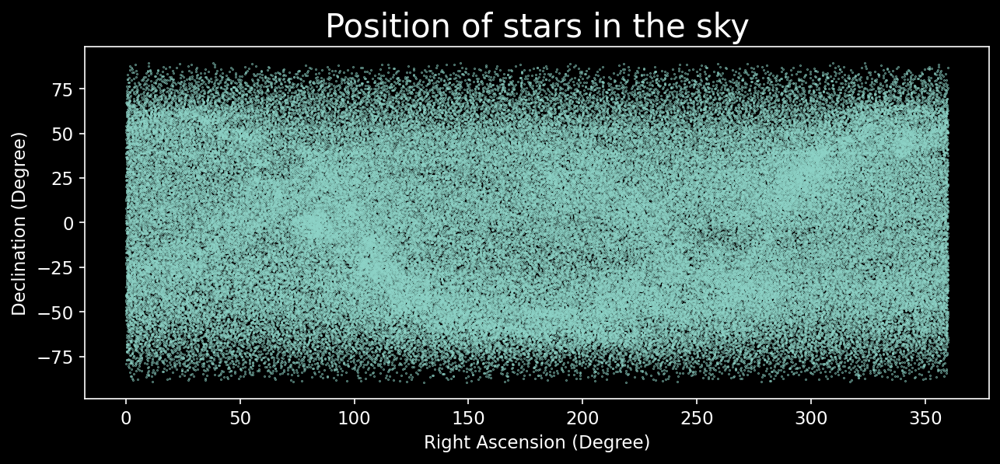

In [110]:
plt.plot(hipp_df["RAdeg"], hipp_df["DEdeg"], 'o', markersize = 0.3)

plt.xlabel("Right Ascension (Degree)")
plt.ylabel("Declination (Degree)")
plt.title ("Position of stars in the sky")
plt.show()

In [194]:
hipp_df["Vmag"].describe()

count    118217.000000
mean          8.373233
std           1.312044
min          -1.440000
25%           7.640000
50%           8.440000
75%           9.150000
max          14.080000
Name: Vmag, dtype: float64

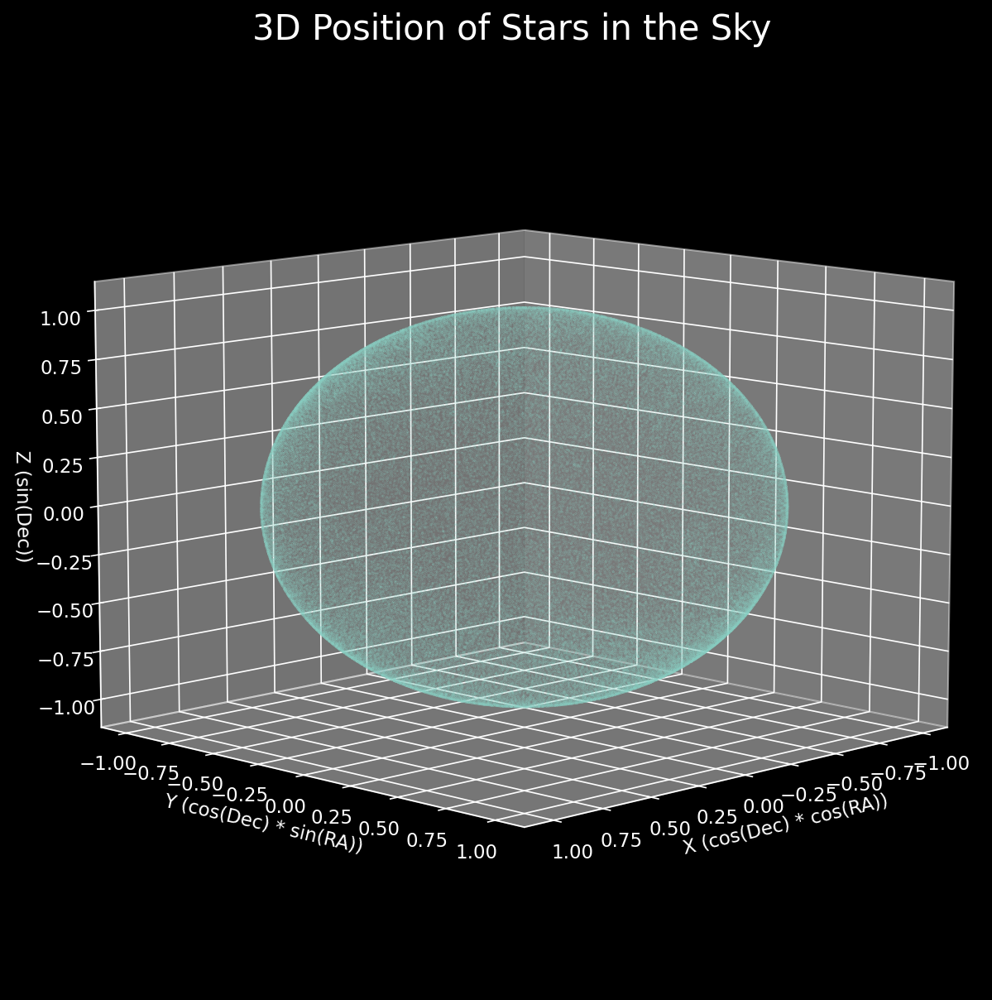

In [203]:

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Set Seaborn style
#sns.set(style="whitegrid")

# Assuming hipp_df has columns "RAdeg", "DEdeg", and "Distance"
ra_rad = np.deg2rad(hipp_df["RAdeg"])
dec_rad = np.deg2rad(hipp_df["DEdeg"])
distance = np.ones_like(ra_rad)  # Replace with actual distance if available

# Convert to Cartesian coordinates
x = distance * np.cos(dec_rad) * np.cos(ra_rad)
y = distance * np.cos(dec_rad) * np.sin(ra_rad)
z = distance * np.sin(dec_rad)

# size = (hipp_df["Vmag"].max() - hipp_df["Vmag"]) + 1  
# size = np.clip(size, 0.0001, 1) 


# Create 3D plot with Matplotlib, using Seaborn styling
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='3d')

# s= size
# para tomar un parametro para el tamaño de los puntos
ax.scatter(x, y, z, s=0.01, marker='o', alpha=0.5)

ax.set_xlabel("X (cos(Dec) * cos(RA))")
ax.set_ylabel("Y (cos(Dec) * sin(RA))")
ax.set_zlabel("Z (sin(Dec))")
ax.set_title("3D Position of Stars in the Sky")

# Rotate view
ax.view_init(elev=10, azim=45)
plt.show()


Las estrellas en el catálogo cubren prácticamente todo el cielo. Nota que en la gráfica vemos regiones de sobredensidades y subdensidades. Estos son términos muy comunes en Astronomía para evaluar qué tan bien está cubierto el cielo por una misión en particular. No profundizaré en estos conceptos aquí. Por ahora, considera las sobredensidades como regiones donde ves más estrellas de lo normal y las subdensidades como regiones donde ves menos estrellas de lo normal.


### 2. Movimiento propio de las estrellas

Ahora visualizamos el movimiento propio de las estrellas tal como lo capturó la misión Hipparcos.

Las estrellas distantes en la [esfera celeste](https://en.wikipedia.org/wiki/Celestial_sphere) parecen permanecer fijas; sin embargo, la mayoría de las estrellas en el vecindario solar parecen moverse a través de la esfera celeste, ya que estas estrellas están más cerca. Este movimiento aparente de las estrellas con respecto a las estrellas fijas en el fondo se llama [movimiento propio](https://en.wikipedia.org/wiki/Proper_motion).

El movimiento propio se mide a lo largo de la Ascensión Recta (pmRA) y a lo largo de la Declinación (pmDE), y se mide en milisegundos de arco por año ($mas\ year^{-1}$), donde mas son milisegundos de arco, una unidad comúnmente utilizada para medir ángulos muy pequeños en el cielo.

$$1 mas = 10^{-3} arcsecond$$


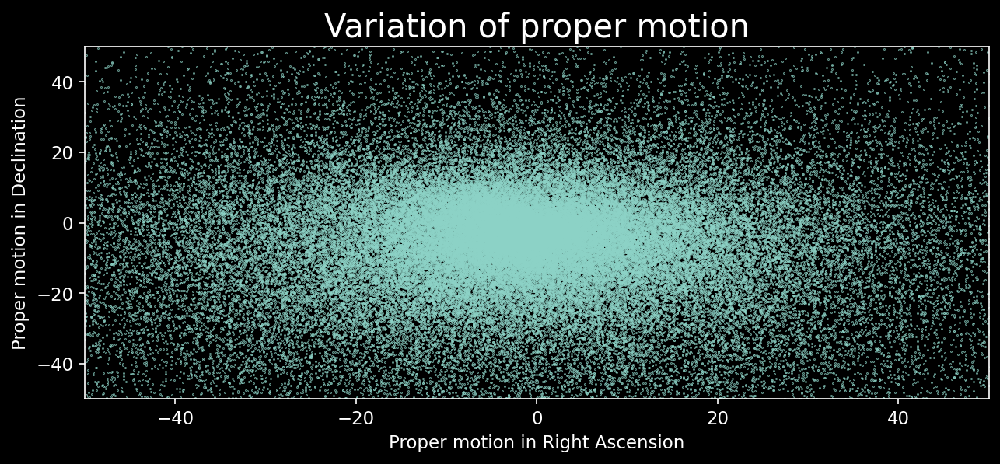

In [111]:
plt.plot(hipp_df["pmRA"], hipp_df["pmDE"], 'o', markersize = 0.3)
plt.xlabel("Proper motion in Right Ascension")
plt.ylabel("Proper motion in Declination")
plt.title ("Variation of proper motion")
plt.xlim(-50, 50)
plt.ylim(-50, 50)
plt.show()

### 3. Distancias en Astronomía

Calcular distancias en Astronomía es uno de los campos de investigación más activos. Esto se debe a la inmensidad del Universo y las limitaciones técnicas de los telescopios. No discutiré en detalle la [escalera de distancias cósmicas](https://en.wikipedia.org/wiki/Cosmic_distance_ladder) en Astronomía; sin embargo, hablaré sobre uno de los métodos geométricos más antiguos y simples para determinar distancias.

El concepto de paralaje surge del hecho de que las estrellas parecen moverse con respecto a las estrellas de fondo cuando se observan desde el mismo lugar en la Tierra y con un intervalo de observación de unos seis meses, es decir, miramos una estrella y luego miramos la misma estrella cuando la Tierra está en el otro lado de su órbita. Este cambio de posición de la Tierra hace que la estrella desplace su posición formando un arco en el cielo. Este desplazamiento angular de la estrella en el cielo se llama paralaje.

Calculamos la distancia de paralaje usando trigonometría, cuyos detalles se pueden encontrar [aquí](http://https://lco.global/spacebook/distance/parallax-and-distance-measurement/).

En términos simples, la distancia en pársecs se da por:

$$d = \frac{1}{p}$$

donde p es la paralaje medida en segundos de arco.

Mirando la forma matemática de la distancia anterior, ¿podrías proponer una definición de paralaje?

Nota: Las mediciones de paralaje pueden ser altamente inexactas para distancias mayores a unos pocos kpc (kilopársecs).


Ahora utilizamos la relación distancia-paralaje para calcular las distancias a las estrellas en los datos de Hipparcos. Debemos recordar que la paralaje en el catálogo Hipparcos está en mas o milisegundos de arco (mas, ya que la unidad de paralaje es común en los estudios del cielo. ¿Podrías pensar por qué?). La inversión directa de la paralaje nos dará la distancia en kpc, y por lo tanto, las distancias obtenidas deben multiplicarse por un factor de $10^3$ para obtener la distancia en pársecs.

Para simplificar, trabajaré con kilopársecs a menos que se necesite explícitamente otra unidad.

$1kpc = 10^3 pc$


In [112]:
d = 1/hipp_df["Plx"]

In [113]:
d.describe() # nos entrega una estadistica

count    1.179550e+05
mean              inf
std               NaN
min     -1.000000e+02
25%      1.067236e-01
50%      2.004008e-01
75%      3.584229e-01
max               inf
Name: Plx, dtype: float64

Algo no parece estar bien por varias razones.

1. Hay valores infinitos para la media y el máximo, lo que sugiere que hay "divisiones por cero" ocurriendo en el cálculo. Por lo tanto, las paralajes con valores de cero o cercanos a cero deben eliminarse del conjunto de datos para calcular distancias razonables. Las paralajes cercanas a cero corresponden a estrellas que están mucho más lejos.

2. En segundo lugar, hay un `NaN` para la desviación estándar, lo cual tampoco es correcto. Esto sugiere que hay valores faltantes para las paralajes en los conjuntos de datos. Debemos tener esto en cuenta también.

3. El mínimo para la distancia es un valor negativo, lo que indica que hay paralajes negativas en los datos de Hipparcos. Esto también debe considerarse.


In [114]:
hipp_df_par_corrected = hipp_df[hipp_df["Plx"].notna()] # NaNs

# Paralaje positivo y no cercano a 0
hipp_df_par_corrected = hipp_df_par_corrected[hipp_df_par_corrected.Plx > 0.1] 
hipp_df_par_corrected["d"] = 1/hipp_df_par_corrected["Plx"]
hipp_df_par_corrected["d"].describe()

count    113278.000000
mean          0.351714
std           0.596814
min           0.001295
25%           0.115473
50%           0.207900
75%           0.364964
max           9.090909
Name: d, dtype: float64

Las distancias obtenidas parecen tener valores razonables. La estrella más cercana está a aproximadamente 1 pársec (0.001 kpc = 1 pársec) de distancia, mientras que la estrella más lejana está a unos 10 kpc, con una mediana de aproximadamente 200 pc. Si estás familiarizado con la estadística, habrás reconocido de inmediato que la distribución no es normal, sino que está sesgada hacia la derecha.

Vamos a visualizar esto con la ayuda de un histograma a continuación.


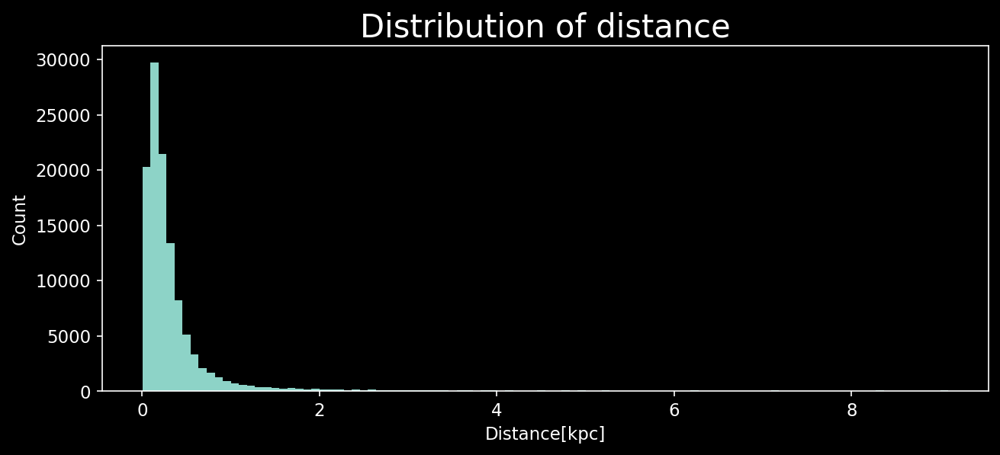

In [115]:
plt.hist(hipp_df_par_corrected["d"], bins = 100)
plt.title("Distribution of distance")
plt.xlabel("Distance[kpc]")
plt.ylabel("Count")
plt.show()

Una visualización aún mejor de estos datos es trazar un gráfico de KDE.

Si no estás familiarizado con los gráficos KDE, [aquí](https://seaborn.pydata.org/generated/seaborn.kdeplot.html) tienes una guía rápida para ayudarte a comenzar.


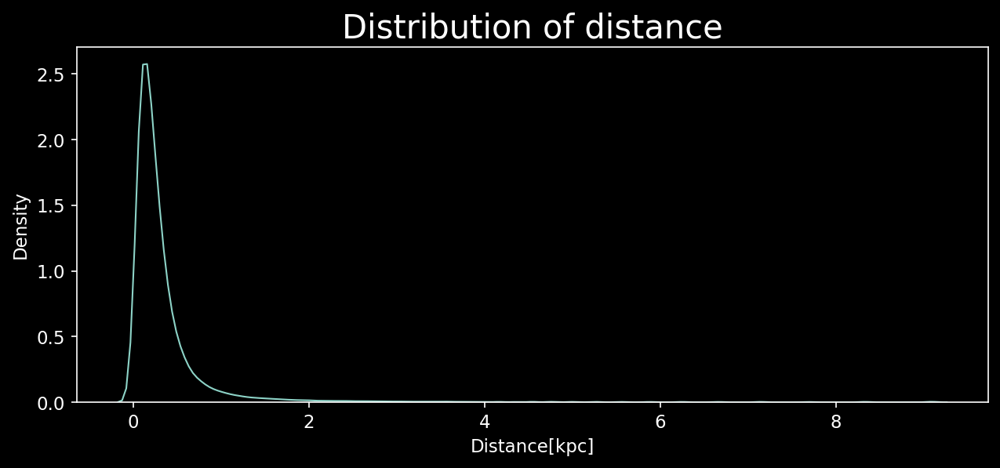

In [116]:
sns.kdeplot(data = hipp_df_par_corrected, x = "d")
plt.title("Distribution of distance")
plt.xlabel("Distance[kpc]")
plt.ylabel("Density")
plt.show()

And that is quite a skewed distribution of the distances involved. Could you think of a reason why this could be?

Hint: Think in terms of parallax angles from the theory of parallaxes. What happens when the angle becomes extremely small?

### 4. Spectral Types

Having understood one of the primary attributes that help astronomers study stars, we now explore another property of stars. We call this property "spectral types" and provide us a way to classify stars based on certain criteria.

Spectral types (referred to as SpType in the catalog) of stars are a way to classify stars with the O-Type stars being the hottest and the M-Type stars being the coldest. 

[Here](https://en.wikipedia.org/wiki/Stellar_classification) is an article from Wikipedia that gives a detailed description of spectral types.

We start by looking at the spectral types available in the Hipparchos data.

In [207]:
hipp_df_par_corrected["SpType"].value_counts()

K0             8264
G5             5883
A0             4791
F8             4289
G0             4153
               ... 
B2V + B2V         1
F3/5 +(A)         1
G5Ib:             1
A4mA7-A9          1
A4:IV/Vn...       1
Name: SpType, Length: 3849, dtype: int64

We do have a problem now. We see that there are about 3849 types of spectral types (The Length attribute reads 3849). This is because there are sub classes of stars within the measured spectral type depending on various parameters (variability, metallicity, etc.) which is beyond the scope of this analysis. Plotting this directly does not give us much information as seen below.

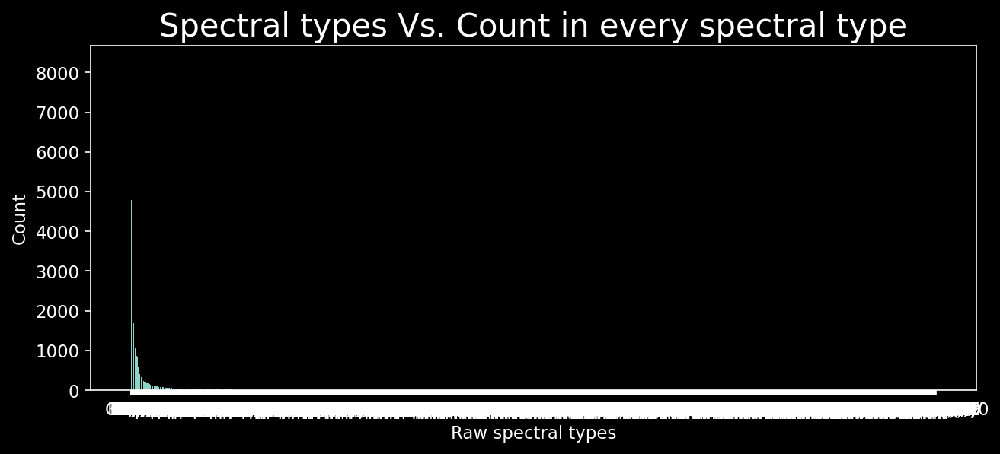

In [208]:
plt.bar(hipp_df_par_corrected["SpType"].value_counts().index, hipp_df_par_corrected["SpType"].value_counts())
plt.xlabel("Raw spectral types")
plt.ylabel("Count")
plt.title("Spectral types Vs. Count in every spectral type")
plt.show()

Since our attempt of plotting the raw spectral types failed miserably, we need a smarter way to get the statistics we are looking forward to. To get an understanding of the spectral types from the catalogue we extract out the first letter from the spectral type information to get an idea of how frequently a spectral type appears in the catalog data.

To do this, we define a function that takes in the dictionary of spectral types obtained above and then count the number of stars in each spectral type. 

Do not worry, if you do not understand how the function works. You could always visit it later.

In [209]:
def get_sptype(sptype):
    O = B = A = F = G = K = M = 0
    for element in sptype.keys():
        if element[0] == 'O':
            O = O + sptype[element]
        elif element[0] == 'B':
            B = B + sptype[element]
        elif element[0] == 'A':
            A = A + sptype[element]
        elif element[0] == 'F':
            F = F + sptype[element]
        elif element[0] == 'G':
            G = G + sptype[element]
        elif element[0] == 'K':
            K = K + sptype[element]
        elif element[0] == 'M':
            M = M + sptype[element]
    return {"O": O, "B": B, "A": A, "F": F, "G": G, "K": K, "M": M}

In [210]:
sptype = hipp_df_par_corrected["SpType"].value_counts()
sptype = sptype.to_dict()
sptype = get_sptype(sptype)
print(sptype)

{'O': 181, 'B': 9469, 'A': 18191, 'F': 25106, 'G': 22250, 'K': 30755, 'M': 4405}


Las clasificamos en el tipo espectral principal, el color de la estrella entrega muchisima informacio

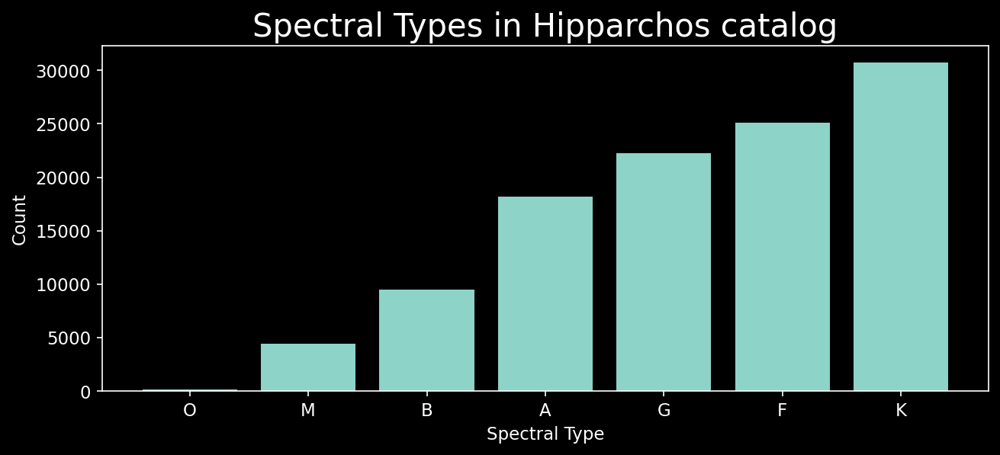

In [211]:
spectral_types = list(sptype.keys())
type_values = list(sptype.values())
data_df = pd.DataFrame({"Spectral_type": spectral_types,
                       "Type_counts": type_values})
data_df = data_df.sort_values("Type_counts")
plt.bar(data_df["Spectral_type"], data_df["Type_counts"])
plt.xlabel("Spectral Type")
plt.ylabel("Count")
plt.title ("Spectral Types in Hipparchos catalog")
plt.show()

In [222]:
set(colors)

{'blue', 'deepskyblue', 'lightyellow', nan, 'orange', 'red', 'white', 'yellow'}

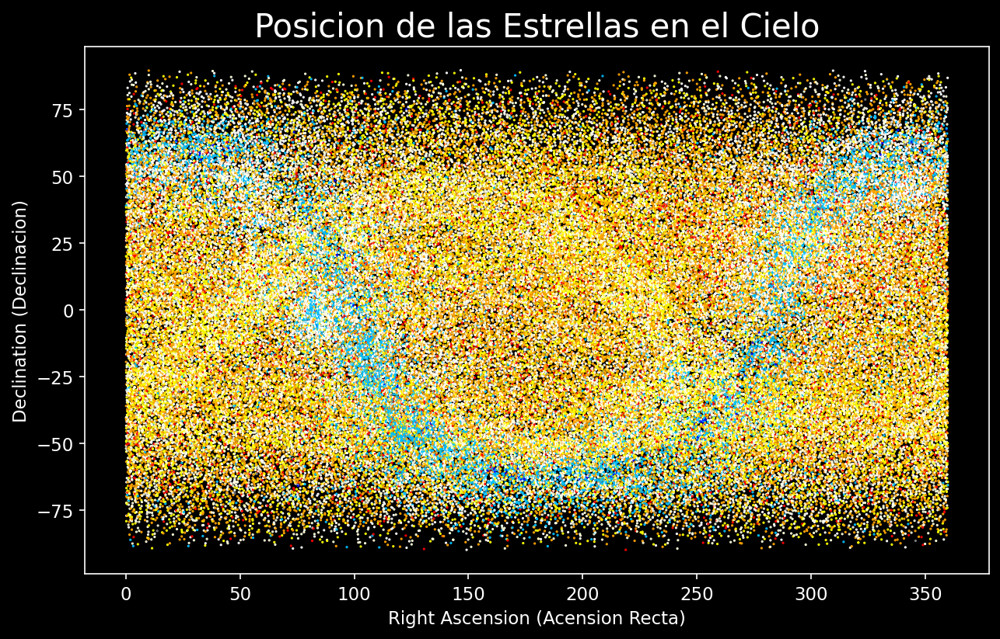

In [234]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming hipp_df has columns "RAdeg", "DEdeg", and "SpType"

# Define color map based on spectral type
color_map = {
    'O': 'blue',
    'B': 'deepskyblue',  # Blue-white
    'A': 'white',
    'F': 'lightyellow',  # Yellow-white approximation
    'G': 'yellow',
    'K': 'orange',
    'M': 'red'
}

# Map the star types to colors

colors = hipp_df_par_corrected["SpType"].str[0].map(color_map)

# Replace NaN values with a default color, such as gray
colors = colors.fillna('gray')

# Plot with colors
plt.figure(figsize=(10, 6))
plt.scatter(hipp_df_par_corrected["RAdeg"], hipp_df_par_corrected["DEdeg"], c=colors, s=0.3, marker='o')

plt.xlabel("Right Ascension (Acension Recta)")
plt.ylabel("Declination (Declinacion)")
plt.title("Posicion de las Estrellas en el Cielo")
plt.show()


In [228]:


# Convert RA and Dec to radians for 3D plotting
ra_rad = np.deg2rad(hipp_df_par_corrected["RAdeg"])
dec_rad = np.deg2rad(hipp_df_par_corrected["DEdeg"])

def plot_3d(ra_rad, dec_rad, distance, colors):
    # Convert to Cartesian coordinates
    x = distance * np.cos(dec_rad) * np.cos(ra_rad)
    y = distance * np.cos(dec_rad) * np.sin(ra_rad)
    z = distance * np.sin(dec_rad)

    # Create subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': '3d'})

    # Different rotations for each subplot
    angles = [(30, 60), (30, 120), (30, 180)]

    for ax, angle in zip(axs, angles):
        # Scatter plot
        ax.scatter(x, y, z, c=colors, s=0.3, marker='o', alpha=0.7)
        ax.set_xlabel("X (cos(Dec) * cos(RA))")
        ax.set_ylabel("Y (cos(Dec) * sin(RA))")
        ax.set_zlabel("Z (sin(Dec))")
        ax.view_init(elev=angle[0], azim=angle[1])
        ax.set_title(f"View: Elev={angle[0]}, Azim={angle[1]}")

    # Adjust layout and show plot
    plt.tight_layout()


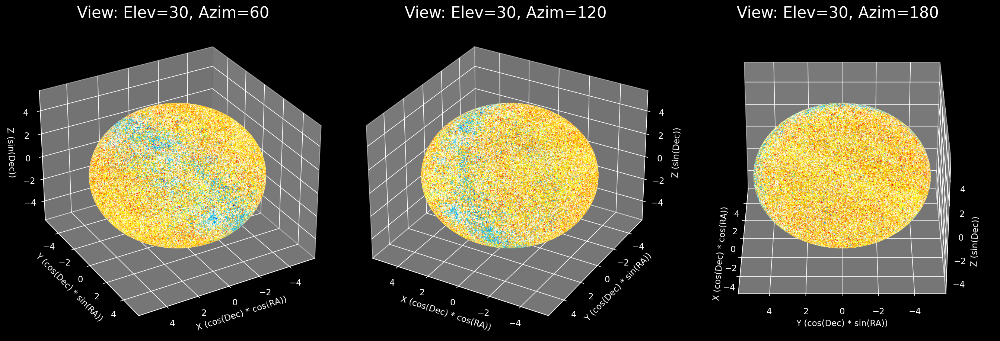

In [229]:
plot_3d(ra_rad, dec_rad, 5, colors)

In [231]:
hipp_df_par_corrected["d"].describe()

count    110742.000000
mean          0.353671
std           0.595974
min           0.001295
25%           0.117925
50%           0.210084
75%           0.367647
max           9.090909
Name: d, dtype: float64

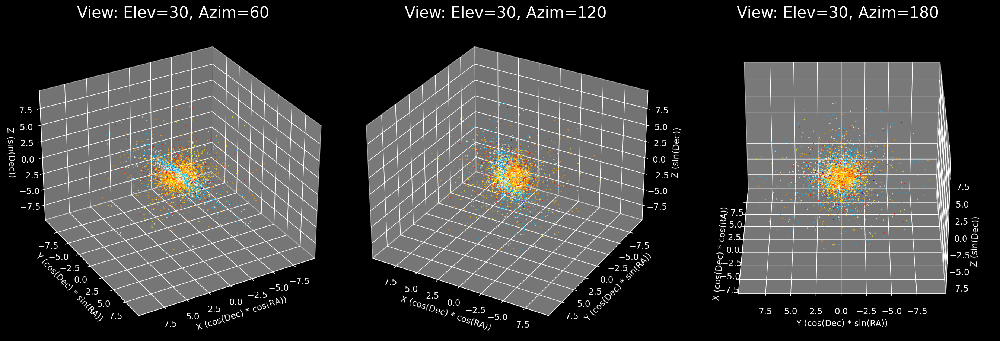

In [233]:
distance = hipp_df_par_corrected["d"]

plot_3d(ra_rad, dec_rad, distance, colors)

Did you notice something? The population of the hotter stars is fairly less than the population of the colder stars with an exception of the M-class stars. 

Do you think this is a glitch while observing the stars? Perhaps the Hipparchos mission was biased towards the colder population of stars. Or is there a science behind this observation?

[Think about how stars evolve from their birth to death]

How do you explain the very low numbers of the M-type stars?

### 5. Spectral types along with luminosity classes

To get a deeper understanding of spectral types, we dive one step deeper in our spectral classes. If you look closely, each of the spectral type has a number associated with it as the second character. This is a further sub classification of stars and in modern Astronomy, these two characters are collectively called the spectral type. For example, our Sun in a G5 star, etc. Further, these numbers vary from 0 to 9.

I will show you one of these classes below.

You should change the argument that goes with the startswith() function to other spectral types and verify that this is indeed the case for all of the spectral types.

In [122]:
sptype = hipp_df_par_corrected["SpType"].value_counts()
a_list = []
for key in sptype.keys():
    if key.startswith("A"):
        a_list.append(key)
    
a_list = set(a_list)
print(a_list)

{'A9IV/Vw...', 'A9m...', 'A9/F0V+...', 'A8V+...', 'A2V...', 'A5m', 'A5:V+...', 'A2mA9-F2', 'A5.5', 'A0III', 'A0p SrCrEu', 'Ap SiLam4200', 'A9IVm', 'A8', 'A5/A8m...', 'A4Vm', 'A8III/IV', 'Ap EuCr(Sr)', 'A4:p', 'A+...', 'A1Vn...', 'A0Iab', 'A4IV', 'A2Vs', 'A3V...', 'A5IIIm...', 'A9IV/V+...', 'A3/A4III', 'A6p', 'A5+...', 'A9/F0IV', 'A1mA6-F0', 'A8/A9Vm...', 'Ap EuCr', 'A5Vn', 'A3IIIs', 'A3 + K', 'A0III:w', 'A3-F5II-III', 'A2Ib/IIp', 'A6/A7:+(G)', 'A4mA3-F3', 'A2V + GIII', 'A2mA6-A9', 'A2III/IV', 'A5.0-F7.0', 'A2IIev comp', 'A4II/III', 'A9IIIm...', 'A8p', 'A9IVm...', 'A3mA7-F0', 'A0Ib', 'A3/A4V', 'A5:w', 'A3III/IVs..', 'A5/A6IV', 'A3II/III', 'A7:V+...', 'A1m A5-F0', 'A3mA5-F0', 'A0pvar', 'A4:IV/Vn...', 'A8.7:', 'A5...', 'A3e...', 'A2IVn', 'A7IVe', 'A:...', 'A6Vn', 'A7V', 'A1p Si', 'A7IV', 'A0II', 'A4.5V', 'A7p+...', 'A7/A8IVm...', 'A2V+...', 'AmA7-F2', 'A2/A3IV', 'A3m+...', 'A3Vnn', 'A0...', 'A4:+...', 'A9III-IV', 'A3m', 'A0IV/V+...', 'A7...', 'A7p:', 'A5V...', 'A9:+...', 'A8w', 'A2IV(m)',

We will now look at the distribution of stars within a given spectral type.

The function that does this job for us follows the same logic as the function above with a few additional checks. Again, do not worry of you do not understand the function completely, the idea is to familiarize ourselves with the data in hand.

In [123]:
def get_new_sptype(sptype, spclass):
    class_0 = class_1 = class_2 = class_3 = class_4 = class_5 = class_6 = class_7 = class_8 = class_9 =0
    for element in sptype.keys():
        if len(element) == 1:
            continue
        if element[0] == spclass:
            if (ord(element[1]) >= 48 and ord(element[1]) <= 57): 
                if element[1] == "0":
                    class_0 = class_0 + sptype[element]
                if element[1] == "1":
                    class_1 = class_1 + sptype[element]
                if element[1] == "2":
                    class_2 = class_2 + sptype[element]
                if element[1] == "3":
                    class_3 = class_3 + sptype[element]
                if element[1] == "4":
                    class_4 = class_4 + sptype[element]
                if element[1] == "5":
                    class_5 = class_5 + sptype[element]
                if element[1] == "6":
                    class_6 = class_6 + sptype[element]
                if element[1] == "7":
                    class_7 = class_7 + sptype[element]
                if element[1] == "8":
                    class_8 = class_8 + sptype[element]
                if element[1] == "9":
                    class_9 = class_9 + sptype[element]
                
    return {"class0": class_0, "class1": class_1, "class2": class_2, "class3": class_3, "class4": class_4, "class5": class_5, "class6": class_6, "class7": class_7, "class8": class_8, "class9": class_9}

In [124]:
sptype = hipp_df_par_corrected["SpType"].value_counts()
sptype = sptype.to_dict()
sptype = get_new_sptype(sptype, "A")

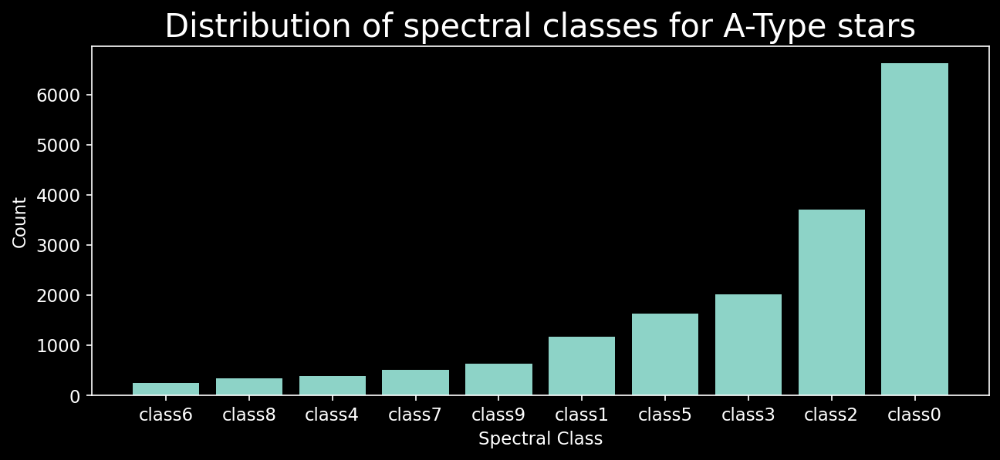

In [125]:
spectral_types = list(sptype.keys())
type_values = list(sptype.values())
data_df = pd.DataFrame({"Spectral_type": spectral_types,
                       "Type_counts": type_values})
data_df = data_df.sort_values("Type_counts")
plt.bar(data_df["Spectral_type"], data_df["Type_counts"])
plt.xlabel("Spectral Class")
plt.ylabel("Count")
plt.title ("Distribution of spectral classes for A-Type stars")
plt.show()

We see a fair distribution of spectral classes within the A-Type stars in the catalogue. I will now show you a similar distribution for all the spectral types namely from spectral type "O" to spectral type "M" with the O type stars being the hottest and the most luminous and the M type stars being the coolest and the least luminous stars.

If I tell you class 0 objects are the brightest while the class 9 stars are the least brightest stars within a spectral type, could you guess why the numbers gradually decrease towards the least brightest stars?

In [126]:
spectral_type = ["O", "B", "A", "F", "G", "K", "M"]
spectral_class = []
sptype = hipp_df_par_corrected["SpType"].value_counts()
sptype = sptype.to_dict()
for sp_type in spectral_type:
    sptype_count = get_new_sptype(sptype, sp_type)
    spectral_class.append(sptype_count)

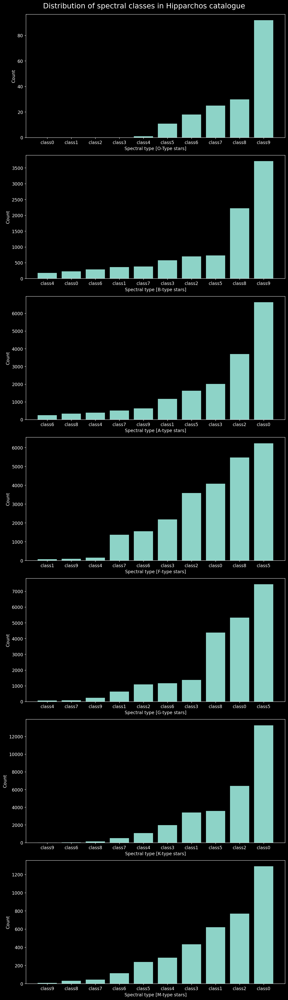

In [127]:
fig, ax = plt.subplots(7, 1, figsize = (10, 35))
fig.suptitle("Distribution of spectral classes in Hipparchos catalogue\n\n", fontsize = 18, 
             ha = "center")
plt_position = 0
spec_label = ["O-Type stars", "B-type stars", "A-type stars", "F-type stars", "G-type stars",
              "K-type stars", "M-type stars"]
for element in spectral_class:
    spectral_types = list(element.keys())
    type_values = list(element.values())
    data_df = pd.DataFrame({"Spectral_type": spectral_types,
                            "Type_counts": type_values})
    data_df = data_df.sort_values("Type_counts")
    ax[plt_position].bar(data_df["Spectral_type"], data_df["Type_counts"])
    ax[plt_position].set_xlabel("Spectral type [{}]".format(spec_label[plt_position]))
    ax[plt_position].set_ylabel("Count")
    plt_position += 1
plt.tight_layout() 
plt.show()

### 6. The magnitude system in Astronomy

Now that we understand the distribution of stars in different spectral types, we now look at different types of magnitudes used in Astronomy.

The first of these is the vmag or the visual magnitude of a star. Stars in the sky are designated a number that tells us how easily a star could be seen on the sky. For historical reasons, the magnitude is defined in such a way that lower is the value of the `vmag`, the brighter is the star. Further, these magnitudes are what we call the apparent magnitudes of the stars owing to the fact that these values of the vmag are as observed by the telescope. There is a way to convert apparent magnitudes into absolute magnitudes which we come to later.

For now, we are interested in looking at the distribution of the vmag. We do this using a histogram.

Text(0.5, 1.0, 'Distribution of the apparanet visual magnitude')

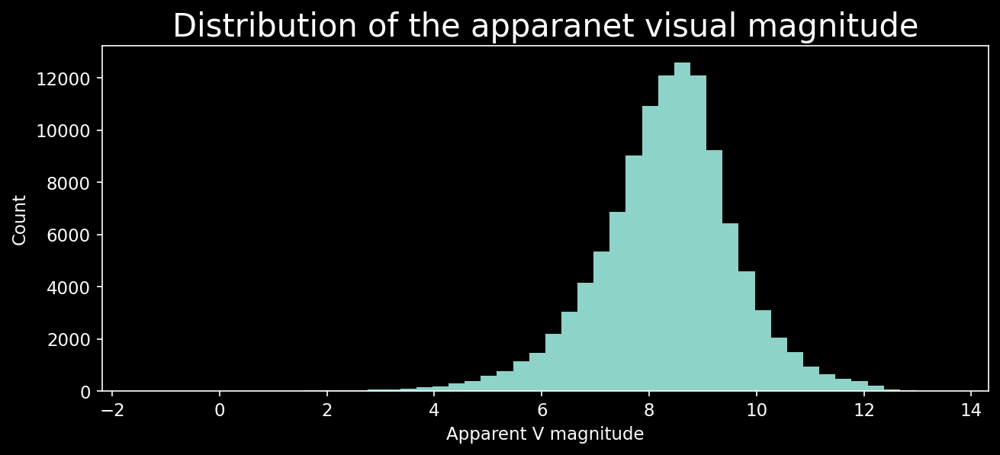

In [128]:
plt.hist(hipp_df_par_corrected["Vmag"], bins = 50)
plt.xlabel("Apparent V magnitude")
plt.ylabel("Count")
plt.title("Distribution of the apparanet visual magnitude")

We see that the distribution peaks around 8. The telescope did a pretty good job at finding the stars which are harder to see since stars with vmag > 6 are the ones which cannot be seen by unaided eye. This is a visual proof of how telescopes changed the field of Astronomy drastically since the 1600s when Galileo introduced telescopes. Besides, the computing powers today and the developments of electronics to better handle the telescopes, the primary reason telescopes revolutionized the field is due to their power to capture super faint stars.

The most recent catalogue published by Gaia called Gaia DR3 (Data Release 3) has the faintest stars having a vmag of ~21. These stars are astoundingly faint when compared to the stars with vmag of the Hipparchos catalogue. Anyways, back to the Hipparchos catalogue.

The other magnitude systems available in the Hipparchos catalogue are as follows,

- BTmag: Mean BT magnitude
- VTmag: Mean VT magnitude
- Hpmag: The mean magnitude in the Hipparchos catalogue

We now check the distribution of these magnitude systems in the catalogue.

Text(0.5, 1.0, 'Distribution of the apparanet BT magnitude')

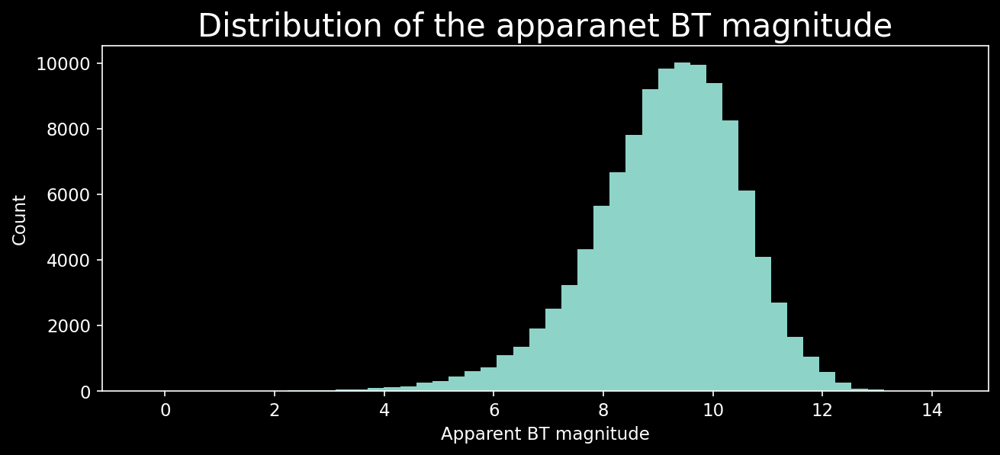

In [129]:
plt.hist(hipp_df_par_corrected["BTmag"], bins = 50)
plt.xlabel("Apparent BT magnitude")
plt.ylabel("Count")
plt.title("Distribution of the apparanet BT magnitude")

The BT magnitude peaks somewhere near 9 which is also a feat to be relished.

Text(0.5, 1.0, 'Distribution of the apparanet VT magnitude')

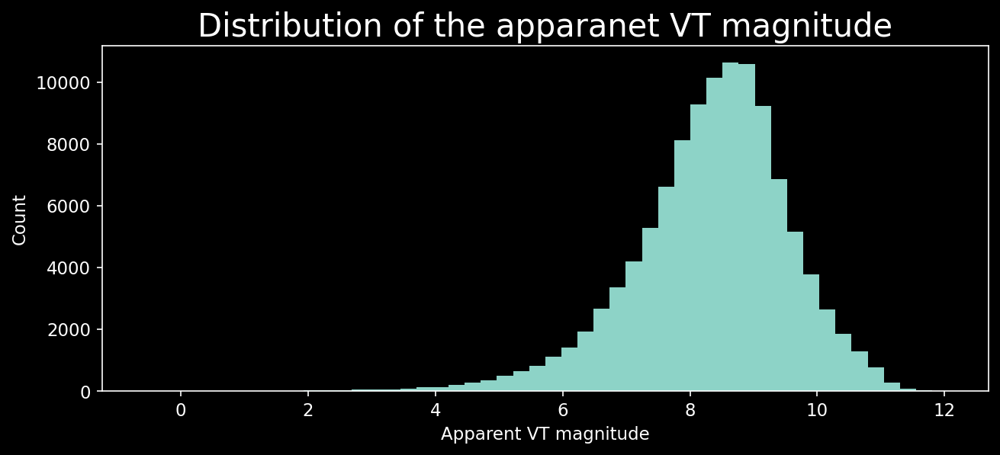

In [130]:
plt.hist(hipp_df_par_corrected["VTmag"], bins = 50)
plt.xlabel("Apparent VT magnitude")
plt.ylabel("Count")
plt.title("Distribution of the apparanet VT magnitude")

The VT magnitude also peaks somewhere near the magnitude of 9.

Text(0.5, 1.0, 'Distribution of the apparanet HP magnitude')

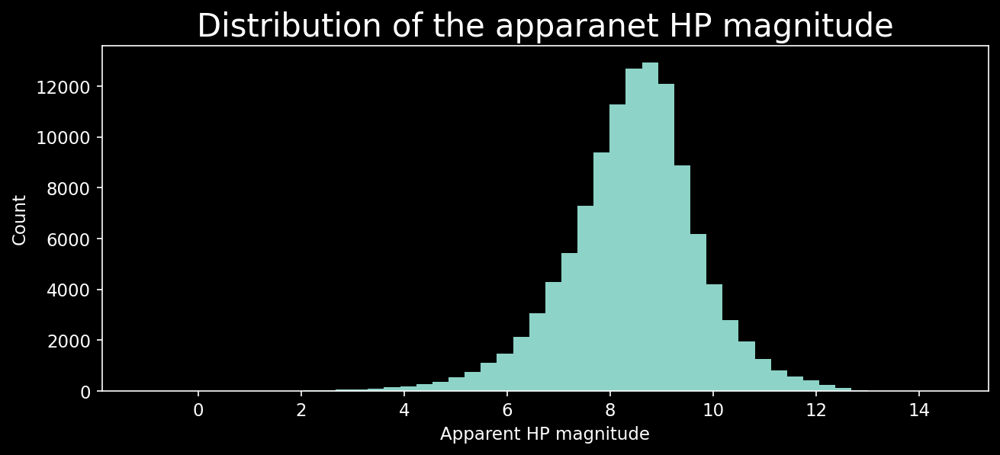

In [131]:
plt.hist(hipp_df_par_corrected["Hpmag"], bins = 50)
plt.xlabel("Apparent HP magnitude")
plt.ylabel("Count")
plt.title("Distribution of the apparanet HP magnitude")

The HP magnitude peaks somewhere near 8 again.

**Your assignment:** Try plotting the KDEPlots of the magnitude systems in a similar way we did for the distance statistics above.

#### Aside (Cumulative distribution of the magnitude system)
It is a usual practice in Astronomy to display a cumulative distribution of the stars. We do this below.

Text(0.5, 1.0, 'Distribution of the apparanet visual magnitude (Cumulative)')

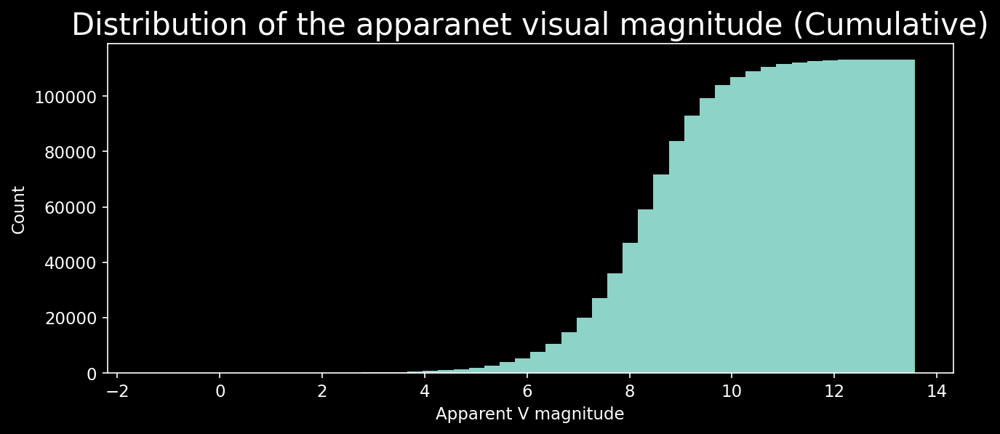

In [132]:
plt.hist(hipp_df_par_corrected["Vmag"], bins = 50, cumulative = True)
plt.xlabel("Apparent V magnitude")
plt.ylabel("Count")
plt.title("Distribution of the apparanet visual magnitude (Cumulative)")

In practice, a large number of stars are studied and a cumulative distribution of the stars is plotted. The slope of the curve is directly related to the number density of stars which in turn helps us do Cosmology. This helps astronomers verify the [cosmological principle](https://en.wikipedia.org/wiki/Cosmological_principle#:~:text=In%20modern%20physical%20cosmology%2C%20the,should%2C%20therefore%2C%20produce%20no%20observable)

### 7. Variable Stars

A [variable star](https://en.wikipedia.org/wiki/Variable_star) is a star whose apparent magnitude fluctuates over a period of time. These stars are characterized by their variability period which might vary from a few hours to a few days or even to a few years depending on the type and evolution history of the star we are looking at.

The Hippachos catalog captures variable stars too and the column `period` gives us the variability period in days. The below plot shows us the distribution of these variable stars in the observational data.

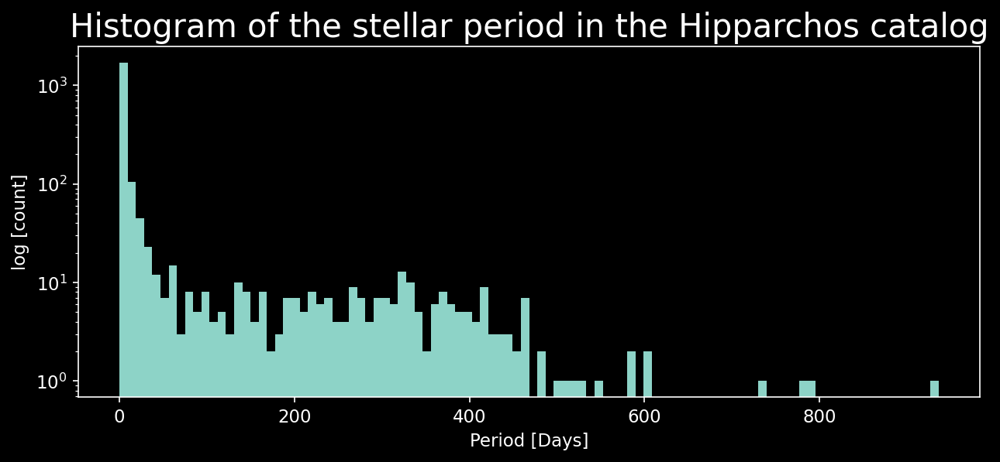

In [133]:
plt.hist(hipp_df_par_corrected["Period"], bins = 100, log = True)
plt.xlabel("Period [Days]")
plt.ylabel("log [count]")
plt.title("Histogram of the stellar period in the Hipparchos catalog")
plt.show()

We see that most of the stars have variability period that is less than 400 days. We see less and less stars towards the higher end of the period. Further, we observe that the histogram peaks at a variability period of 0 which indicates that most of the stars in the catalogue are not variable stars.

Related to the notion of the variability of stars, astronomers often divide the stars in different types of variability classes. This data helps us differentiate the type of variable stars and thus helps us in understanding the evolutionary tracks of these stars. Remember, after the main sequence  comes to an end, the stars could be on any of the evolutionary tracks characterized by different features. 

We now look at the distribution of the variability of the stars.

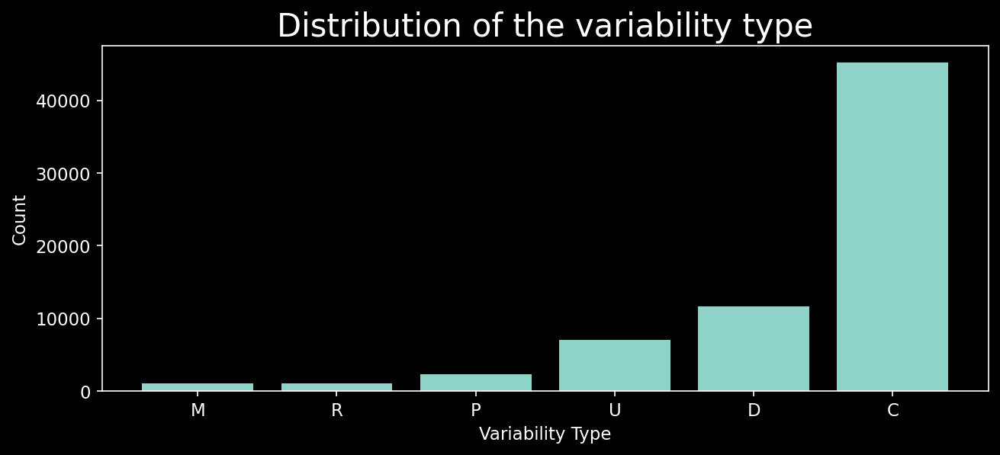

In [134]:
sources = hipp_df_par_corrected["HvarType"].value_counts().index
count = hipp_df_par_corrected["HvarType"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Variability Type")
plt.ylabel("Count")
plt.title("Distribution of the variability type")
plt.show()

The variability types means the following,

- C : no variability detected ("constant")

- D : duplicity-induced variability

- M : possibly micro-variable, with amplitude < 0.03 mag (stars classified with high confidence as micro-variable are flagged U)

- P : periodic variable

- R : the V-I color index was revised during the variability analysis

- U : unsolved variable which does not fall in the other categories; this class also includes irregular or semi-regular variables, and possibly variables with amplitude > or ~ 0.03 mag

This is in alignment with what we observe in the variability histogram where most of the stars were seen as the ones that are not variable (Type C: no variability detected)

### 8. The HR Diagram

Having understood the magnitude of stars and how are they distributed in space (from the observational data of Hipparchos of course), we now turn towards what is called the **Hertzsprung–Russell diagram or simply the HR diagram** in Astronomy.

The [HR diagram](https://en.wikipedia.org/wiki/Hertzsprung%E2%80%93Russell_diagram) is a plot showing a population of stars relating their absolute magnitudes or luminosities to their effective temperatures. Since getting the temperatures is usually a difficult task and Astronomers like to take the easy way, we plot a variation of the HR diagram called the Color magnitude diagram.

Before going ahead with the HR diagram, let us first understand the notion of absolute magnitude and the color index.

#### 8.1 Absolute magnitude and the color index

**Absolute magnitude**: The [absolute magnitude](https://en.wikipedia.org/wiki/Absolute_magnitude) is defined to be the magnitude of an object when observed from a standard distance of 10 parsecs. The absolute magnitude is obtained from the apparent magnitude using the below relation,

$$M = m - 5\times \log_{10}(d_{pc}) + 5 = m - 5\times (\log_{10}(d_{pc}) + 1)$$

where the term $5\times (\log_{10}(d_{pc}) + 1)$ is called the distance modulus and is denoted by $\mu$. Hence, the absolute magnitude of an object could be written as,

$$M = m - \mu$$
    
**Color Index**: Understanding the color index might be tricky for starters (at least it was to me when I was a beginner). Technically speaking, telescopes observe objects using [filters](https://en.wikipedia.org/wiki/Astronomical_filter#:~:text=An%20astronomical%20filter%20is%20a,for%20viewing%20or%20for%20photography.) and the color of an object is the difference in the apparent magnitudes between any of these filters. In English, the color index in Astronomy determines the color of an object and is obtained by systematically taking the differences between various magnitudes. In the hipparchos catalogue, the below colors are available,
    - B-V color
    - V-I color

In the plot below, I have considered the B-V color of the objects in the [UBV photometric](https://en.wikipedia.org/wiki/UBV_photometric_system) system.

Before we proceed further with plotting the HR diagram, we must do some sanity checks so that the plot comes out as clean as possible. The only sanity checks needed here is to ensure that the Vmag field in the catalogue and the color index B-V does must not have null values.

In [135]:
hipp_df_par_corrected["Vmag"].isna().sum()

0

In [136]:
hipp_df_par_corrected["B-V"].isna().sum()

883

We see that the column Vmag does not have null values while the column B-V color has null values which must be removed for a cleaner plot.

In [137]:
hipp_df_color_corrected = hipp_df_par_corrected[hipp_df_par_corrected["B-V"].notna()]
hipp_df_color_corrected.shape

(112395, 79)

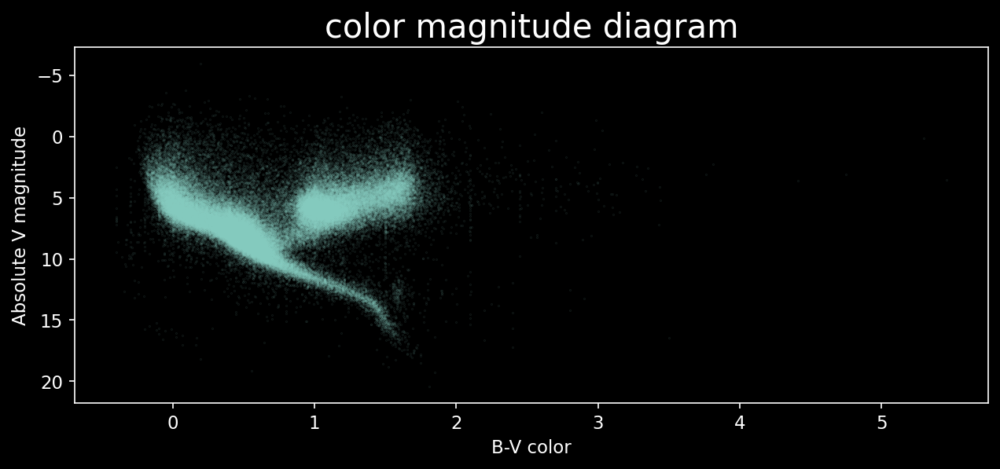

In [138]:
distance = hipp_df_color_corrected["d"] * 1000 #Obtaining the distance in parsecs
distance_modulus = 5 * (np.log10(distance / 10) - 1) #Calculate the distance modulus
abs_v_mag = hipp_df_color_corrected["Vmag"] - distance_modulus #Get the absolute V magnitude of the sources
plt.plot(hipp_df_color_corrected["B-V"], abs_v_mag, marker='.', linestyle='none', alpha=0.3, markersize = 0.3)
plt.gca().invert_yaxis()
plt.xlabel("B-V color")
plt.ylabel("Absolute V magnitude")
plt.title("color magnitude diagram")
plt.show()

The plot above shows us a distinct main sequence, a clear main sequence cut off and a distinct giant branch. This is true for any arbitrary population of stars and helps Astronomers study stellar clusters in detail.

We will now plot the HR diagram, i.e. the plot of absolute magnitude with effective temperature. As mentioned earlier, calculating the effective temperature is difficult. We calculate the effective temperature using Ballesteros' formula.

$$T = 4600K\Bigg(\frac{1}{0.92 (B-V) + 1.7} + \frac{1}{1.5 (B-V) + 0.62}\Bigg)$$

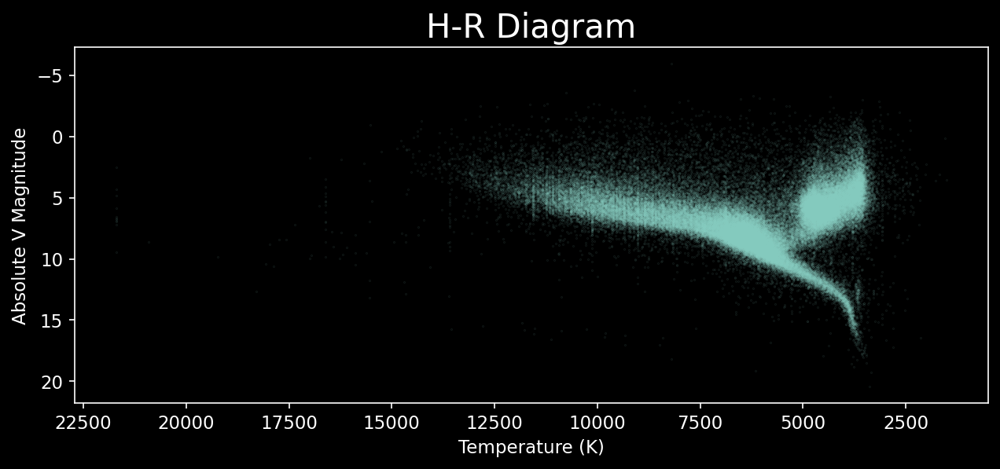

In [139]:
temperature = 4600 * (1/(0.92 * hipp_df_color_corrected['B-V'] + 1.7) + 1/(0.92 * hipp_df_color_corrected['B-V'] + 0.62)) #Ballesteros formula
plt.plot(temperature, abs_v_mag, marker='.', linestyle='none', alpha=0.3, markersize = 0.3)
plt.xlabel('Temperature (K)')
plt.ylabel("Absolute V Magnitude")
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.title("H-R Diagram")
plt.show()

As expected we see a very similar plot as obtained with the color magnitude diagram above.

**Your assignment:** You must now try to obtain the color magnitude diagram and the HR diagram using any other magnitude available in the catalogue. For instance, try plotting the color magnitude diagram using the V-I color and the V magnitude. What did you get? Does your plot resemble the one shown here?

### 9. Measurement errors in Astronomy

The astronomy dataset provided by the Hipparchos survey has a few entries that talk about the standard error in the observations of certain quantities. A few important errors are as below,

* e_RAdeg: The standard error in determining the right ascension of an object
* e_DEdeg: The standard error in determining the declination of an object
* e_plx: The standard error in determining the parallax of an object
* e_pmra: The standard error in determining the proper motion along right ascension
* e_pmde: The standard error in determining the declination along declination

To analyze these errors and see if could see any trend in the variation, we limit ourselves to the stars that have a positive parallax. This is necessary because as you will see, the variation is very evident when plotted against the distance estimation of the stars.

Our objective here will be to analyze the errors in measurement as a function of the parallax distance.

In [140]:
hipp_err_df = hipp_df_color_corrected[["e_RAdeg", "e_DEdeg", "e_Plx", "e_pmRA", "e_pmDE"]]
hipp_err_df["Distance"] = distance
hipp_err_df.head()

,e_RAdeg,e_DEdeg,e_Plx,e_pmRA,e_pmDE,Distance
0,1.32,0.74,1.39,1.36,0.81,282.485876
1,1.28,0.70,3.10,1.74,0.92,45.662100
2,0.53,0.40,0.63,0.57,0.47,355.871886
3,0.53,0.59,0.97,0.65,0.65,129.032258
4,0.64,0.61,1.11,0.67,0.74,348.432056


An important point to be kept in mind here is that the distance is arbitrary with no particular order. If you are naive and plot the line graphs blindly, you will end up in a mess of lines going from everywhere to everywhere. Hence, we sort the dataframe based on the distances to get an order in the dataframe.

In [141]:
hipp_err_df.sort_values("Distance", inplace = True)

We are now ready to plot the variation of errors with distance to see whether we find any correlation between the attributes. 

[Before going further, with the knowledge you have of distances, do you think the errors is measurement will go up as the distance increases or will it come down?]

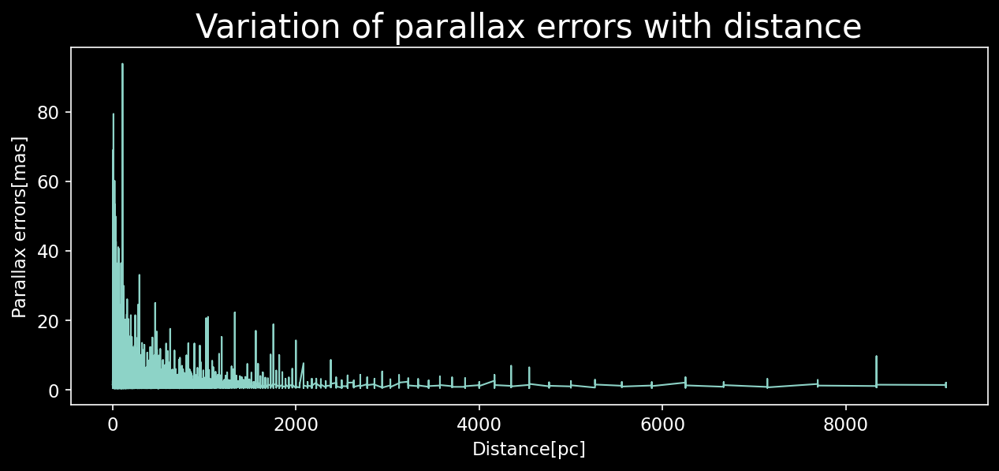

In [142]:
plt.plot(hipp_err_df["Distance"], hipp_err_df["e_Plx"])
plt.xlabel("Distance[pc]")
plt.ylabel("Parallax errors[mas]")
plt.title("Variation of parallax errors with distance")
plt.show()

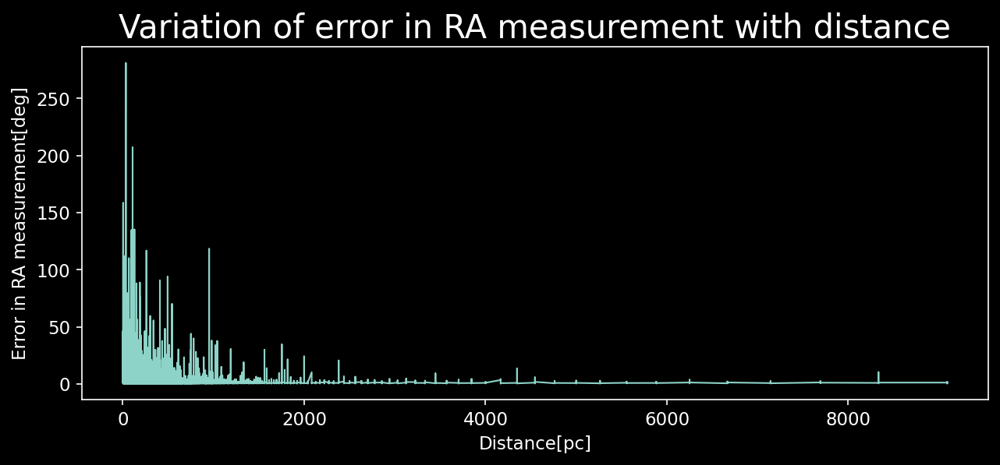

In [143]:
plt.plot(hipp_err_df["Distance"], hipp_err_df["e_RAdeg"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in RA measurement[deg]")
plt.title("Variation of error in RA measurement with distance")
plt.show()

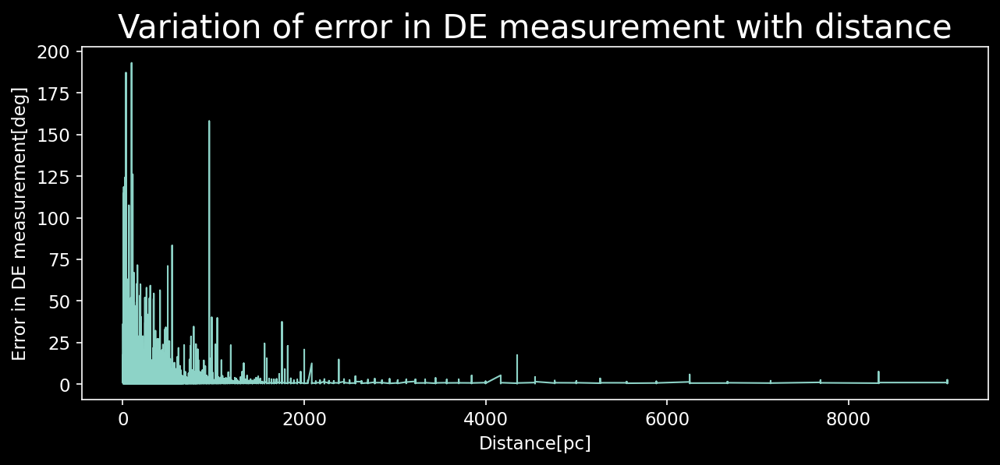

In [144]:
plt.plot(hipp_err_df["Distance"], hipp_err_df["e_DEdeg"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in DE measurement[deg]")
plt.title("Variation of error in DE measurement with distance")
plt.show()

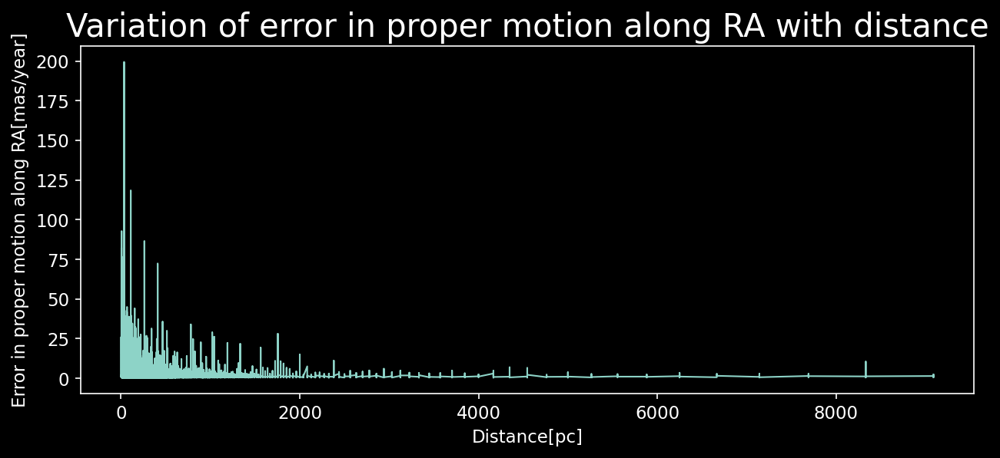

In [145]:
plt.plot(hipp_err_df["Distance"], hipp_err_df["e_pmRA"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in proper motion along RA[mas/year]")
plt.title("Variation of error in proper motion along RA with distance")
plt.show()

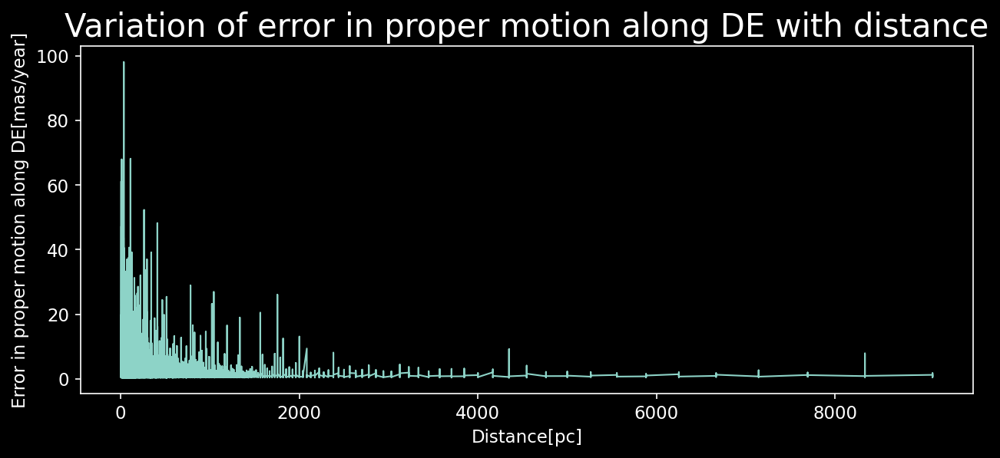

In [146]:
plt.plot(hipp_err_df["Distance"], hipp_err_df["e_pmDE"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in proper motion along DE[mas/year]")
plt.title("Variation of error in proper motion along DE with distance")
plt.show()

In all of the above plots we observe that the spikes are very large below $2000$ parsecs and then it remains fairly constant. A naive Astronomer might conclude by looking at the plots above that the errors are the highest in the solar neighborhood and accuse Hipparchos to be a failure.

On a closer look at the plot however, this does not look right. If you answered that the errors are most likely to shoot up at greater distances, you are right? So, what went wrong? The reason behind this strange behavior is with the way matplotlib works and has nothing to do with the survey itself. 

We have already noticed that the number of objects below $2000$ parsecs are far greater than the number of objects at greater distances. What matplotlib is trying to plot here is a line graph that shows the variation of errors of every object with distance and hence a lot of data points are crammed up in a small region of the plot. 

To mitigate this we calculate the median error at different distances and plot them as a line graph. This should match our expectation of having overall greater errors in measurements at greater distances.

If you are a data scientist or a statistician, why can't we take the arithmetic mean of the distances instead. Try redoing this analysis using mean as the metric instead and see what happens? Does the error go up with distance or do you see something else?

**Calculating the median values at different distances**

We define a function get_grouped_df(df) that takes in the error dataframe we created above and perform the steps below,

1. Define a list distance, containing values from minimum distance to the maximum distance with an interval of 100 pc.
2. Filter the input dataframe such that the values within two values are retained in the intermediate dataframe.
3. Calculate the median values using numpy.nanmedian() function. This ignores the nan values if any.
4. Form as dictionary of the median values with the upper limit of the distance as the key.
5. Convert the dictionary to a dataframe.

Again, if you do not understand how this works, skip this part and go to the visuals. However, if you are an adventurous astronomer like me and plan to rework this analysis using the arithmetic mean instead, I recommend spending sometime in understanding how does the function work.

In [147]:
def get_df(data_dict):
    distance = []
    e_RA = []
    e_DE = []
    e_plx = []
    e_pmra = []
    e_pmde = []
    for key in data_dict.keys():
        distance.append(key)
        e_RA.append(data_dict[key][0])
        e_DE.append(data_dict[key][1])
        e_plx.append(data_dict[key][2])
        e_pmra.append(data_dict[key][3])
        e_pmde.append(data_dict[key][4])
    df = pd.DataFrame()
    df["Distance"] = distance
    df["e_RA"] = e_RA
    df["e_DE"] = e_DE
    df["e_plx"] = e_plx
    df["e_pmra"] = e_pmra
    df["e_pmde"] = e_pmde
    return df

In [148]:
def get_grouped_df(hipp_err_df):
    distance = [(val + 1) * 100 for val in  range(100)]
    start_distance = 1
    group_dict = {}
    for dist in distance:
        end_distance = dist
        df = hipp_err_df[hipp_err_df.Distance <= end_distance]
        df = df[df.Distance > start_distance]
        distance = end_distance
        e_RA_median = np.nanmedian(df["e_RAdeg"])
        e_DE_median = np.nanmedian(df["e_DEdeg"])
        e_plx_median = np.nanmedian(df["e_Plx"])
        e_pmra_median = np.nanmedian(df["e_pmRA"])
        e_pmde_median = np.nanmedian(df["e_pmDE"])
        group_dict[distance] = [e_RA_median, e_DE_median, e_plx_median, e_pmra_median, e_pmde_median]
        start_distance = dist
    
    grouped_df = get_df(group_dict)
    return grouped_df

In [149]:
hipp_err_grouped = get_grouped_df(hipp_err_df)
hipp_err_grouped.head()

,Distance,e_RA,e_DE,e_plx,e_pmra,e_pmde
0,100,0.90,0.73,1.10,1.06,0.86
1,200,0.87,0.71,1.07,1.02,0.83
2,300,0.85,0.70,1.06,0.99,0.82
3,400,0.83,0.71,1.06,0.96,0.82
4,500,0.83,0.72,1.08,0.97,0.84


In [150]:
hipp_err_grouped.isna().sum()

Distance     0
e_RA        47
e_DE        47
e_plx       47
e_pmra      47
e_pmde      47
dtype: int64

Since there are nan values in our calculated data, we drop them.

In [151]:
hipp_err_grouped.dropna(inplace = True)

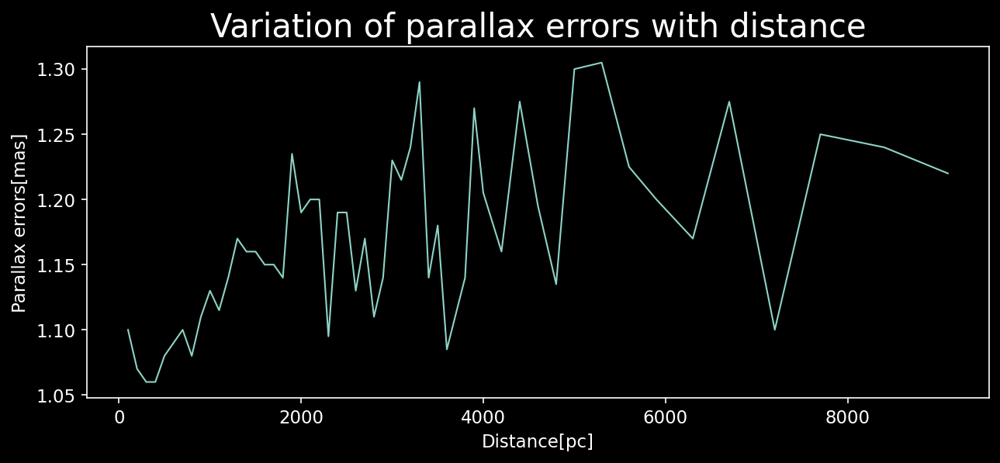

In [152]:
plt.plot(hipp_err_grouped["Distance"], hipp_err_grouped["e_plx"])
plt.xlabel("Distance[pc]")
plt.ylabel("Parallax errors[mas]")
plt.title("Variation of parallax errors with distance")
plt.show()

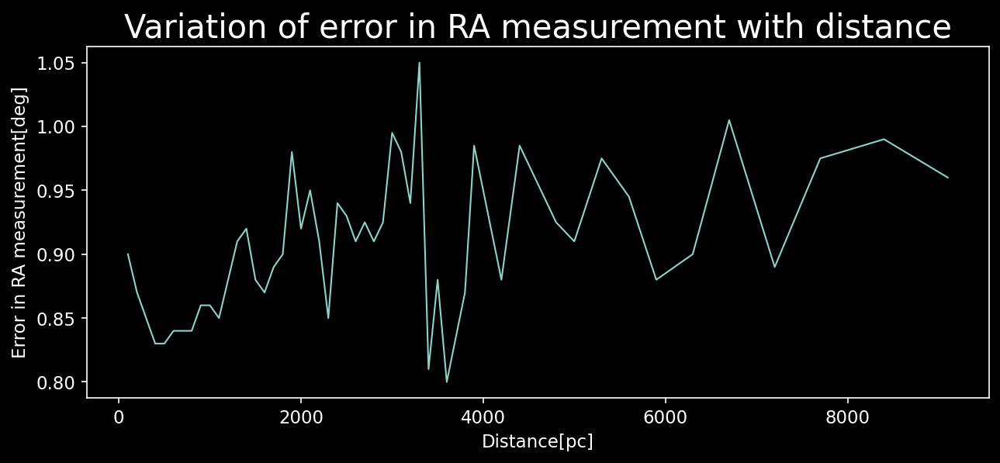

In [153]:
plt.plot(hipp_err_grouped["Distance"], hipp_err_grouped["e_RA"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in RA measurement[deg]")
plt.title("Variation of error in RA measurement with distance")
plt.show()

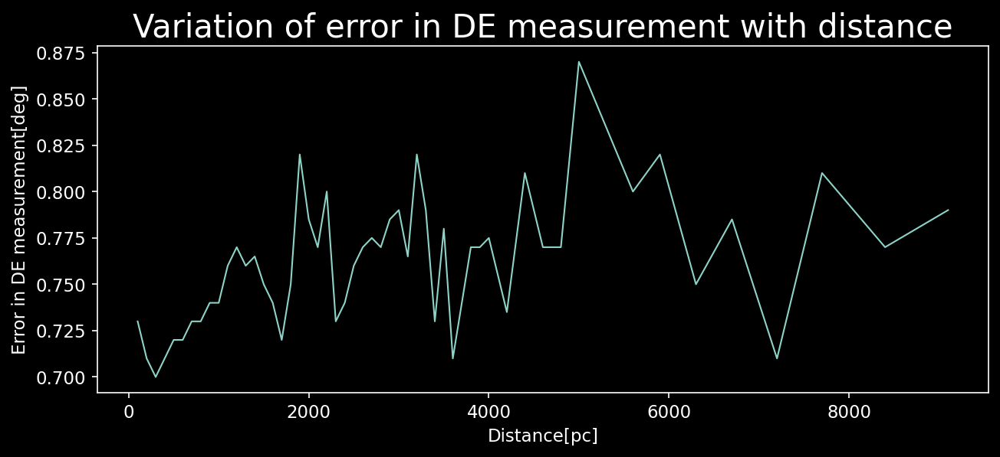

In [154]:
plt.plot(hipp_err_grouped["Distance"], hipp_err_grouped["e_DE"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in DE measurement[deg]")
plt.title("Variation of error in DE measurement with distance")
plt.show()

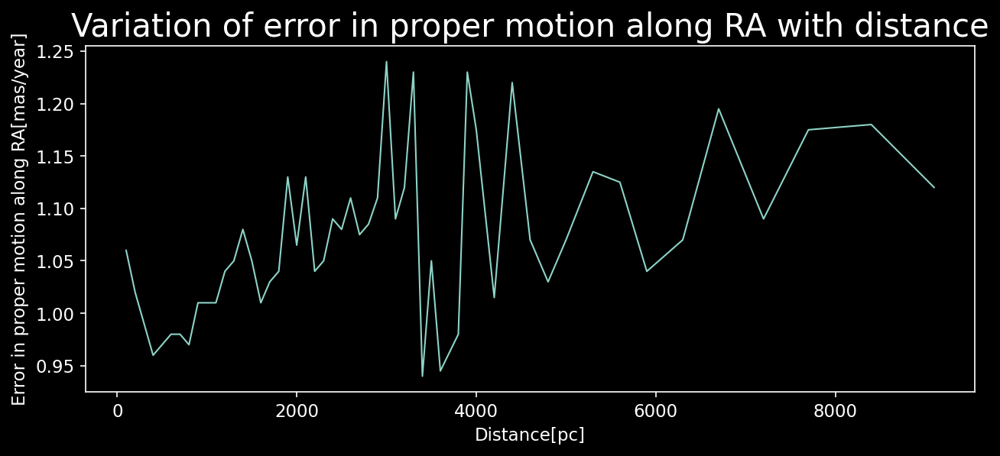

In [155]:
plt.plot(hipp_err_grouped["Distance"], hipp_err_grouped["e_pmra"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in proper motion along RA[mas/year]")
plt.title("Variation of error in proper motion along RA with distance")
plt.show()

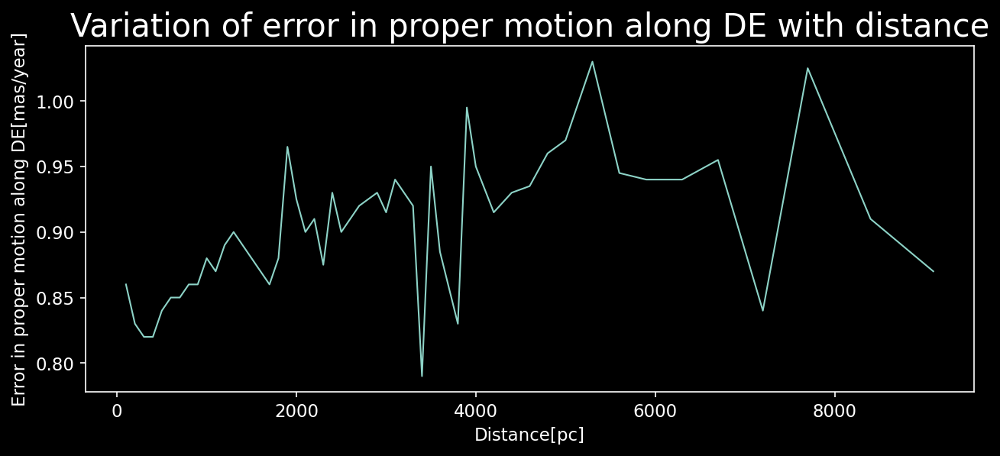

In [156]:
plt.plot(hipp_err_grouped["Distance"], hipp_err_grouped["e_pmde"])
plt.xlabel("Distance[pc]")
plt.ylabel("Error in proper motion along DE[mas/year]")
plt.title("Variation of error in proper motion along DE with distance")
plt.show()

As expected, we see a general trend that rises with the increase in the distance. We confirm this behavior by plotting a regression plot as shown below.

Text(0.5, 1.0, 'Variation of error in RA measurement with distance')

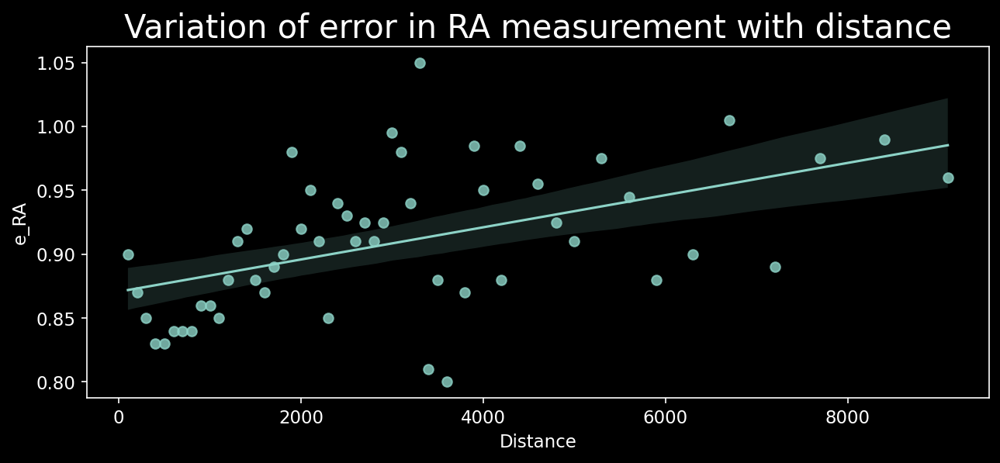

In [157]:
import seaborn as sns
sns.regplot(x = "Distance", 
            y = "e_RA", 
            data = hipp_err_grouped).set_title("Variation of error in RA measurement with distance")

Text(0.5, 1.0, 'Variation of error in DE measurement with distance')

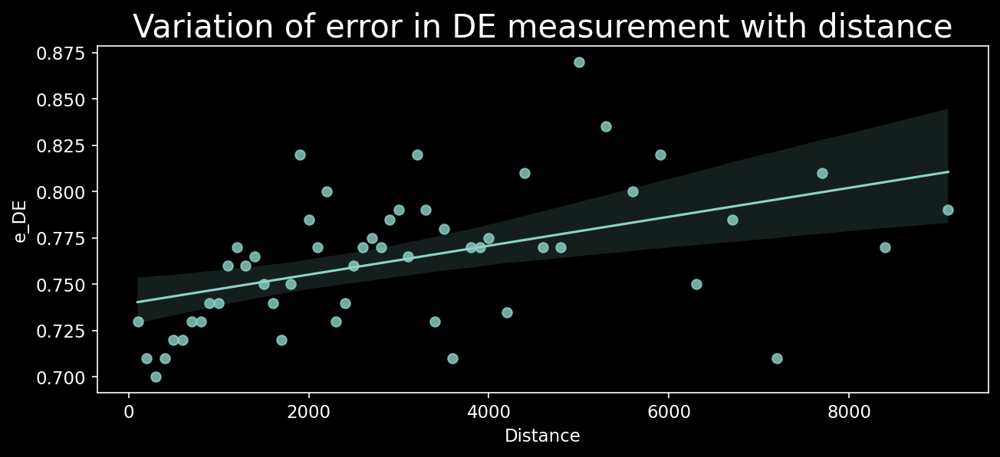

In [158]:
sns.regplot(x = "Distance", 
            y = "e_DE", 
            data = hipp_err_grouped).set_title("Variation of error in DE measurement with distance")

Text(0.5, 1.0, 'Variation of parallax errors with distance')

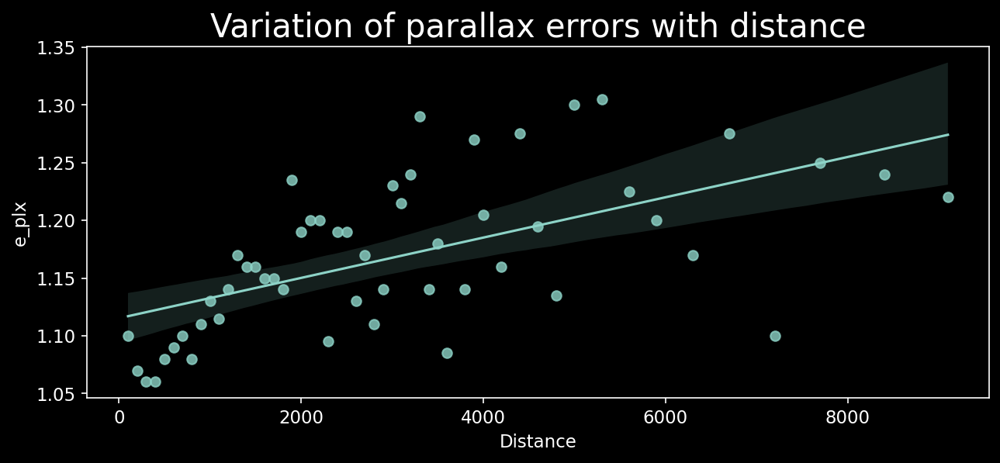

In [159]:
sns.regplot(x = "Distance", 
            y = "e_plx", 
            data = hipp_err_grouped).set_title("Variation of parallax errors with distance")

Text(0.5, 1.0, 'Variation of error in proper motion along RA with distance')

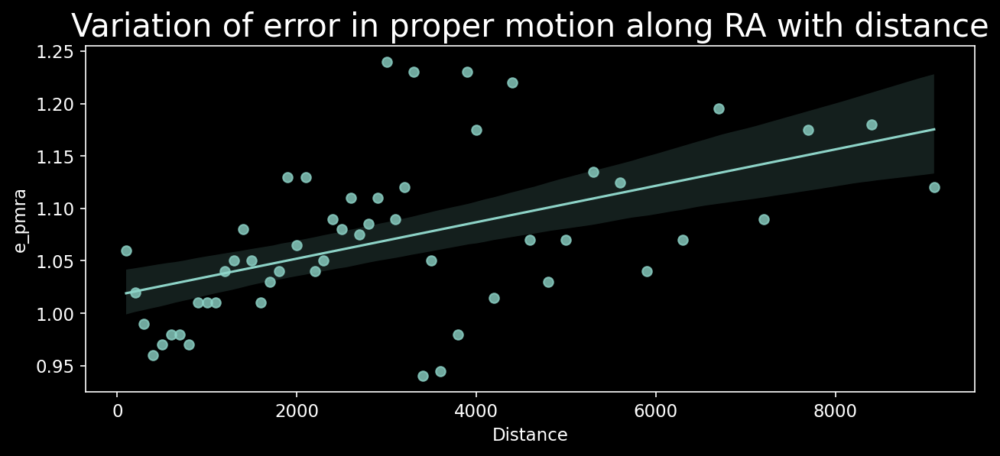

In [160]:
sns.regplot(x = "Distance", 
            y = "e_pmra", 
            data = hipp_err_grouped).set_title("Variation of error in proper motion along RA with distance")

Text(0.5, 1.0, 'Variation of error in proper motion along DE with distance')

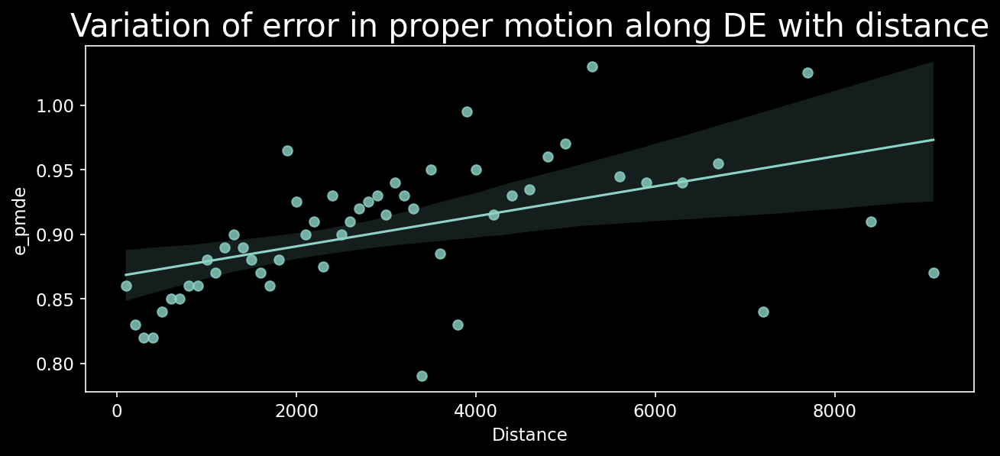

In [161]:
sns.regplot(x = "Distance", 
            y = "e_pmde", 
            data = hipp_err_grouped).set_title("Variation of error in proper motion along DE with distance")

These regression plots reconfirm our inferences about measurement errors with the increase in the distance. In conclusion, we see that the measurement errors go up with the increase in distance.

**Surprise!!!**

While the dependence of the errors on distance looks trivial, there are other dependencies too that might not be that evident at first. This is the dependence of the errors on the apparent magnitude of the stars. In the cells below, I show you one such dependency of errors on the Hpmag field.

We follow the exact steps as we did with distance. The only difference here is that the variance would now be dependent on the magnitude instead of the distance.

In [162]:
hipp_err_df = hipp_df_color_corrected[["e_RAdeg", "e_DEdeg", "e_Plx", "e_pmRA", "e_pmDE", "Hpmag"]]
hipp_err_df.head()

,e_RAdeg,e_DEdeg,e_Plx,e_pmRA,e_pmDE,Hpmag
0,1.32,0.74,1.39,1.36,0.81,9.2043
1,1.28,0.70,3.10,1.74,0.92,9.4017
2,0.53,0.40,0.63,0.57,0.47,6.6081
3,0.53,0.59,0.97,0.65,0.65,8.1498
4,0.64,0.61,1.11,0.67,0.74,8.7077


In [163]:
hipp_err_df.sort_values("Hpmag", inplace = True)

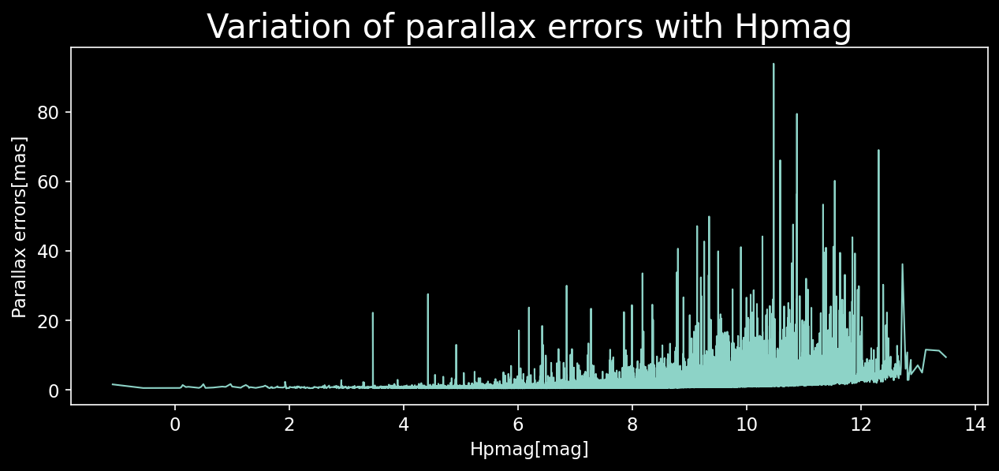

In [164]:
plt.plot(hipp_err_df["Hpmag"], hipp_err_df["e_Plx"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Parallax errors[mas]")
plt.title("Variation of parallax errors with Hpmag")
plt.show()

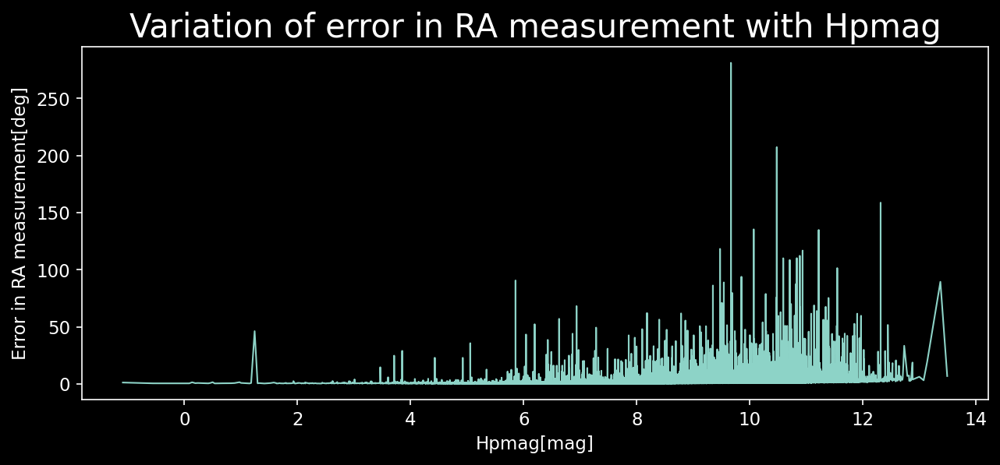

In [165]:
plt.plot(hipp_err_df["Hpmag"], hipp_err_df["e_RAdeg"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in RA measurement[deg]")
plt.title("Variation of error in RA measurement with Hpmag")
plt.show()

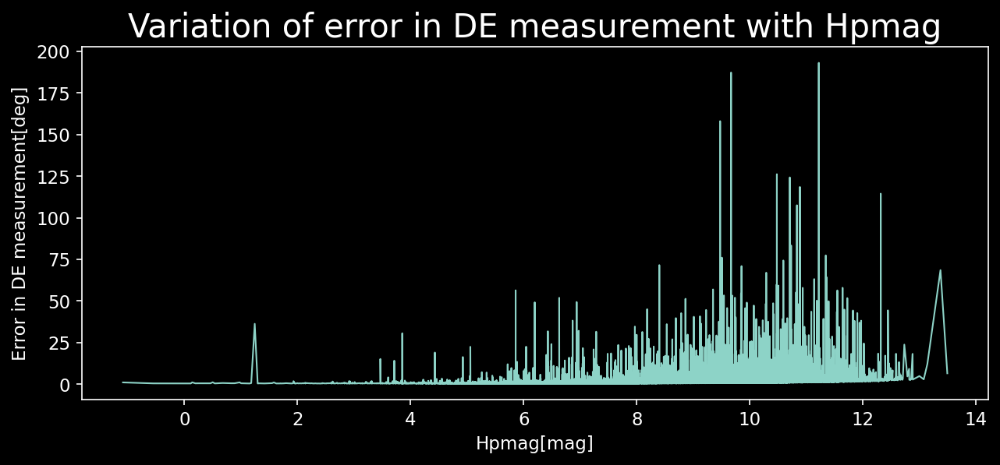

In [166]:
plt.plot(hipp_err_df["Hpmag"], hipp_err_df["e_DEdeg"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in DE measurement[deg]")
plt.title("Variation of error in DE measurement with Hpmag")
plt.show()

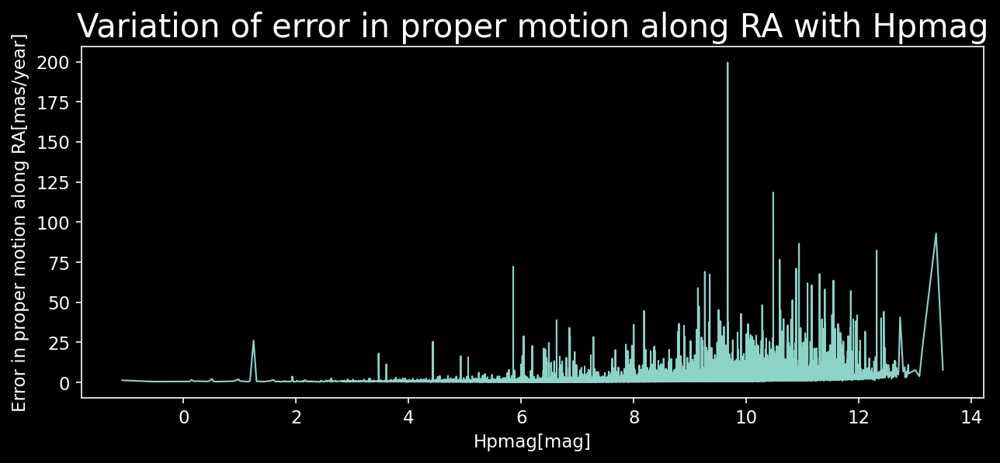

In [167]:
plt.plot(hipp_err_df["Hpmag"], hipp_err_df["e_pmRA"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in proper motion along RA[mas/year]")
plt.title("Variation of error in proper motion along RA with Hpmag")
plt.show()

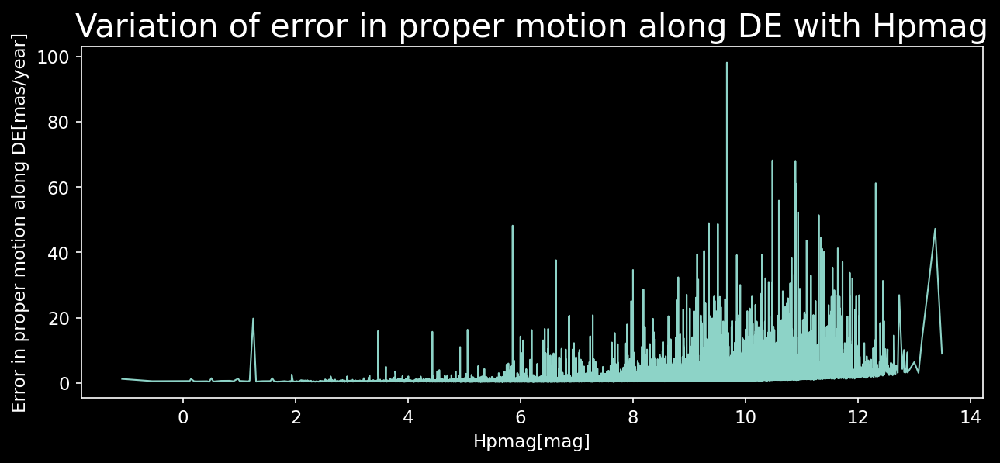

In [168]:
plt.plot(hipp_err_df["Hpmag"], hipp_err_df["e_pmDE"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in proper motion along DE[mas/year]")
plt.title("Variation of error in proper motion along DE with Hpmag")
plt.show()

In all of the above plots we observe that the spikes are very large at higher values of magnitude.

TRICK QUESTION: Isn't it weird that objects that are brighter show higher errors compared to objects that are fainter? What do you think might be the reason?

Assuming that you did fall for the trick question, the answer is no. It is not weird. This is because higher number for the magnitude implies fainter objects --> Astronomy 101.

Anyways concluding that fainter objects have higher errors is not right at this stage because of the way matplotlib works. In these plots too, many observations are crammed in a very small portion of the plot which might be misleading.

To mitigate this we calculate the median error at different magnitudes and plot them as a line graph. This should match our expectations of having overall greater errors in measurable quantities for fainter objects.

In [169]:
def get_mag_df(data_dict):
    Hpmag = []
    e_RA = []
    e_DE = []
    e_plx = []
    e_pmra = []
    e_pmde = []
    for key in data_dict.keys():
        Hpmag.append(key)
        e_RA.append(data_dict[key][0])
        e_DE.append(data_dict[key][1])
        e_plx.append(data_dict[key][2])
        e_pmra.append(data_dict[key][3])
        e_pmde.append(data_dict[key][4])
    df = pd.DataFrame()
    df["Hpmag"] = Hpmag
    df["e_RA"] = e_RA
    df["e_DE"] = e_DE
    df["e_plx"] = e_plx
    df["e_pmra"] = e_pmra
    df["e_pmde"] = e_pmde
    return df

In [170]:
def get_mag_grouped_df(hipp_err_df):
    max_mag = np.max(hipp_err_df["Hpmag"])
    min_mag = np.min(hipp_err_df["Hpmag"])
    hpmag = [(val + 1) for val in  range(int(max_mag) + 1)]
    start_mag = int(min_mag)
    group_dict = {}
    for mag in hpmag:
        end_mag = mag
        df = hipp_err_df[hipp_err_df.Hpmag <= end_mag]
        df = df[df.Hpmag > start_mag]
        magnitude = end_mag
        e_RA_median = np.nanmedian(df["e_RAdeg"])
        e_DE_median = np.nanmedian(df["e_DEdeg"])
        e_plx_median = np.nanmedian(df["e_Plx"])
        e_pmra_median = np.nanmedian(df["e_pmRA"])
        e_pmde_median = np.nanmedian(df["e_pmDE"])
        group_dict[magnitude] = [e_RA_median, e_DE_median, e_plx_median, e_pmra_median, e_pmde_median]
        start_distance = mag
    
    grouped_df = get_mag_df(group_dict)
    return grouped_df

In [171]:
hipp_err_grouped = get_mag_grouped_df(hipp_err_df)
hipp_err_grouped.head()

,Hpmag,e_RA,e_DE,e_plx,e_pmra,e_pmde
0,1,0.70,0.505,0.835,0.735,0.55
1,2,0.69,0.490,0.790,0.700,0.53
2,3,0.65,0.490,0.765,0.715,0.57
3,4,0.64,0.490,0.750,0.680,0.57
4,5,0.63,0.480,0.750,0.680,0.56


In [172]:
hipp_err_grouped.isna().sum()

Hpmag     0
e_RA      0
e_DE      0
e_plx     0
e_pmra    0
e_pmde    0
dtype: int64

Our custom function did a pretty good job this time with no missing values in the generated dataset. We could now plot our variations in errors directly as we did with the distance.

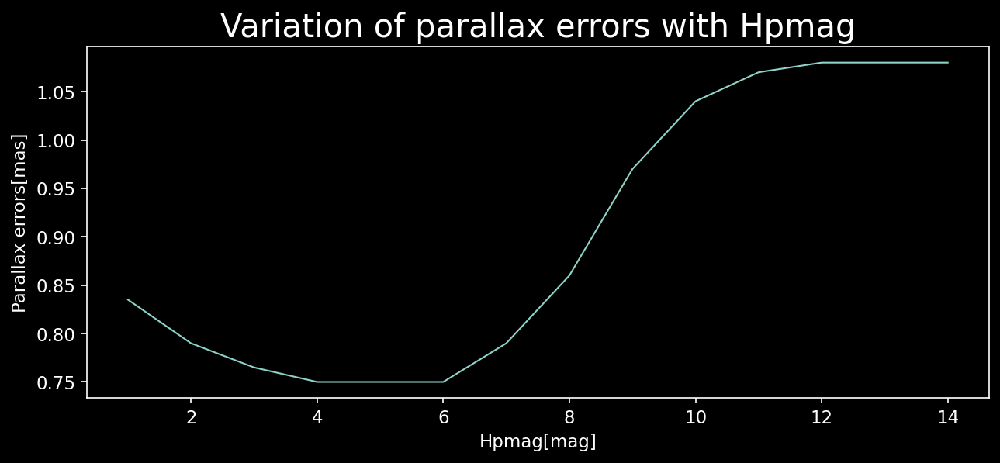

In [173]:
plt.plot(hipp_err_grouped["Hpmag"], hipp_err_grouped["e_plx"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Parallax errors[mas]")
plt.title("Variation of parallax errors with Hpmag")
plt.show()

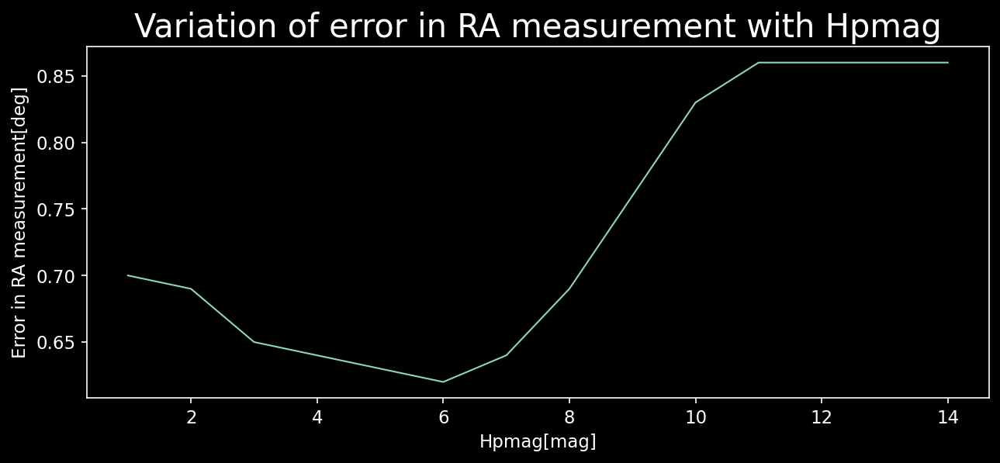

In [174]:
plt.plot(hipp_err_grouped["Hpmag"], hipp_err_grouped["e_RA"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in RA measurement[deg]")
plt.title("Variation of error in RA measurement with Hpmag")
plt.show()

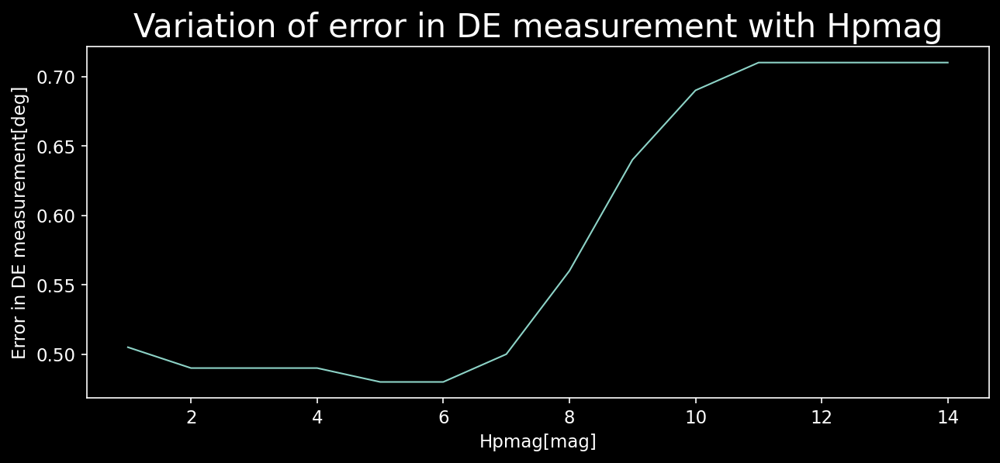

In [175]:
plt.plot(hipp_err_grouped["Hpmag"], hipp_err_grouped["e_DE"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in DE measurement[deg]")
plt.title("Variation of error in DE measurement with Hpmag")
plt.show()

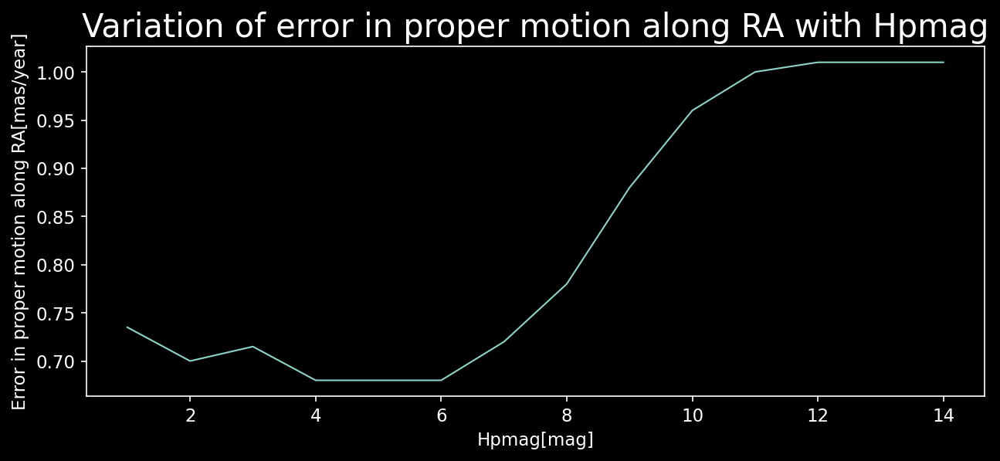

In [176]:
plt.plot(hipp_err_grouped["Hpmag"], hipp_err_grouped["e_pmra"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in proper motion along RA[mas/year]")
plt.title("Variation of error in proper motion along RA with Hpmag")
plt.show()

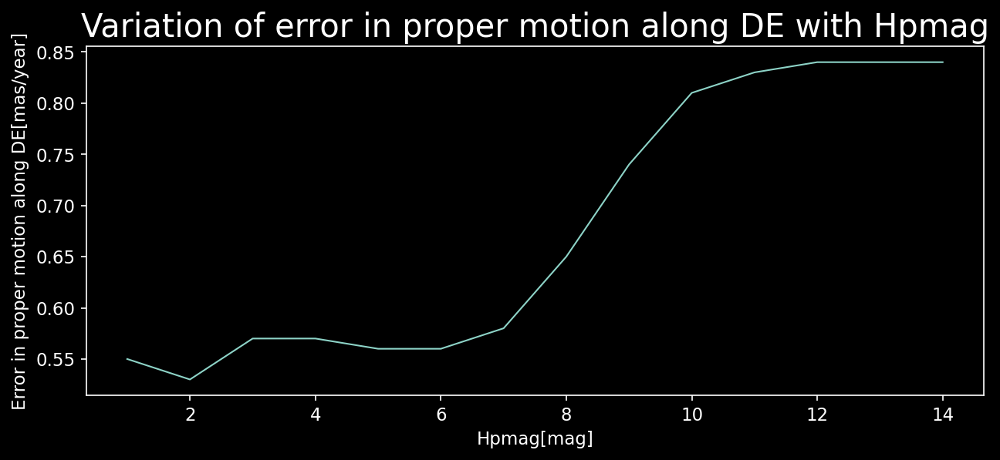

In [177]:
plt.plot(hipp_err_grouped["Hpmag"], hipp_err_grouped["e_pmde"])
plt.xlabel("Hpmag[mag]")
plt.ylabel("Error in proper motion along DE[mas/year]")
plt.title("Variation of error in proper motion along DE with Hpmag")
plt.show()

We see something spectacular in the variation of the errors with Hpmag. Unlike the variation with respect to distances, the variations with respect to magnittude (Hpmag in this case) are rather smooth. In addition, we also see a general trend where the errors shoot up between magnitude $6$ and $10$. This is because, fainter objects are difficult to observe and thus entail greater errors. 

**Your assignment:** Try recreating the regression plots as shown above and observe are the regression lines steeper than the ones we obtained for distances above. Why does this happen?

### 10. (Optional reading) Survey meta data

One of the most useful aspects of any observational mission is the use of certain flags that tell us something about one or more aspects of the observational data. Professional astronomers use these flags to develop routines that help filter stars better. For example, the below plot shows the sources of v_mag for the Hipparchos catalog. Depending on the source of the data, specific corrections could be applied to the measurements to get a more robust set of stars for astronomical data analysis. 

I will not go any deeper in this since this would need knowledge of observational technologies. I simply show the various distributions so that we get an idea of how things work out in a more professional setting. Do not worry, if the jargons do not make sense to you.

**Flag: Sources of V-magnitude**

Photometric space missions of such magnitudes as that of the Hipparchos survey is the culmination of observational data from different telescopes. The below plot shows the sources of the V_magnitude. The meaning of the identifiers are as follows,

**G**: Ground-based multicolor photometry, either directly in or reduced to the Johnson UBV system

**H**: Hipparcos magnitude Hip_mag, combined with information on the color index (either V-I or BT_mag-VT_mag), in combination with the luminosity class

**T**: Tycho photometry, i.e., VT_mag and BT_mag-VT_mag

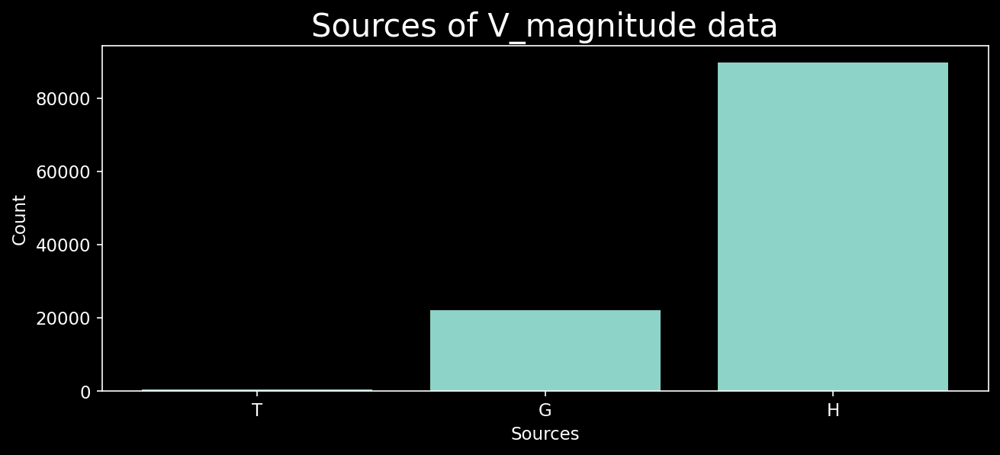

In [178]:
sources = hipp_df_color_corrected["r_Vmag"].value_counts().index
count = hipp_df_color_corrected["r_Vmag"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Sources")
plt.ylabel("Count")
plt.title("Sources of V_magnitude data")
plt.show()

**Flag: Reference flag for astrometry**

Reference flag for astrometric parameters of double and multiple systems. This flag indicates that the astrometric parameters refer to:

A, B etc: the letter indicates the specified component of a double or multiple system

\*: the photocenter of a double or multiple system included in Part C of the Double and Multiple Systems Annex

+: the center of mass: for such an entry, an orbit is given in Part O of the Double and Multiple Systems Annex

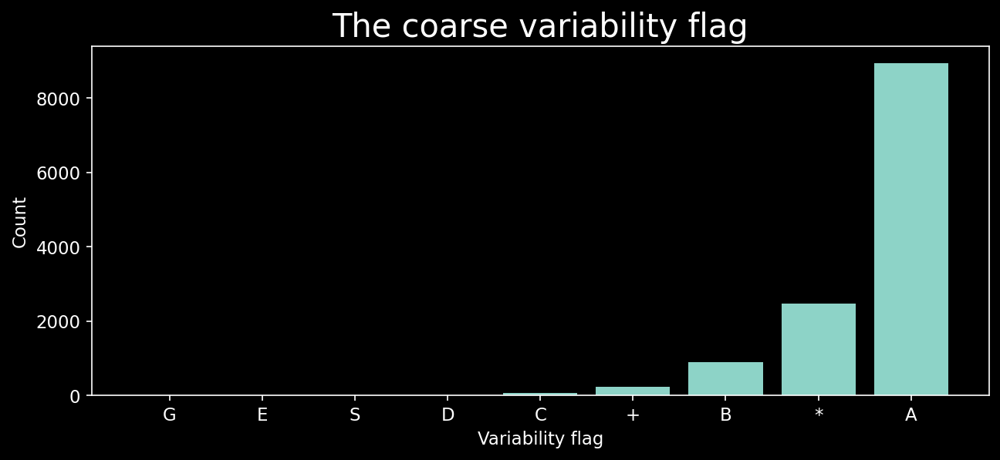

In [179]:
sources = hipp_df_color_corrected["AstroRef"].value_counts().index
count = hipp_df_color_corrected["AstroRef"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Variability flag")
plt.ylabel("Count")
plt.title("The coarse variability flag")
plt.show()

**Flag: Reference flag for Hpmag**

A reference flag for the Hipparcos photometric parameters. For a double or multiple entry, this flag indicates that the photometry refers to:

A, B, etc. : the specified component of a double or multiple system

\* : combined photometry of a double system, corrected for attenuation by the detector's instantaneous field of view profile response

\- : combined photometry of a double system, NOT corrected for attenuation by the detector's instantaneous field of view profile response

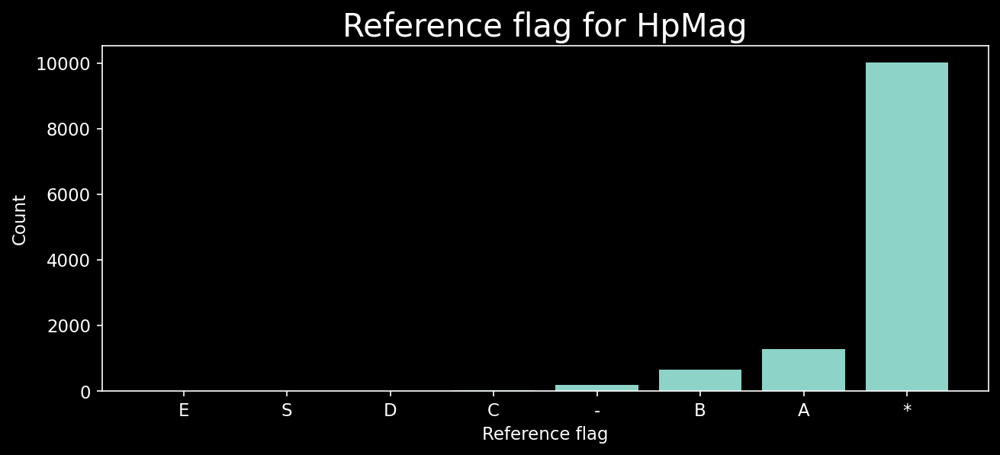

In [180]:
sources = hipp_df_color_corrected["m_Hpmag"].value_counts().index
count = hipp_df_color_corrected["m_Hpmag"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flag")
plt.ylabel("Count")
plt.title("Reference flag for HpMag")
plt.show()

**Flag: Historical status flag**

The historical status of the CCDM identifier.
The flag takes the following values:

H : system determined as double or multiple by the Hipparcos observations, and was previously unknown as double or multiple

I : system previously identified as multiple, as given in Annex 1 of the Hipparcos Input Catalog (HIC)

M : miscellaneous (system had been previously identified, after publication of the HIC, using other more recently available catalogs and compilations)

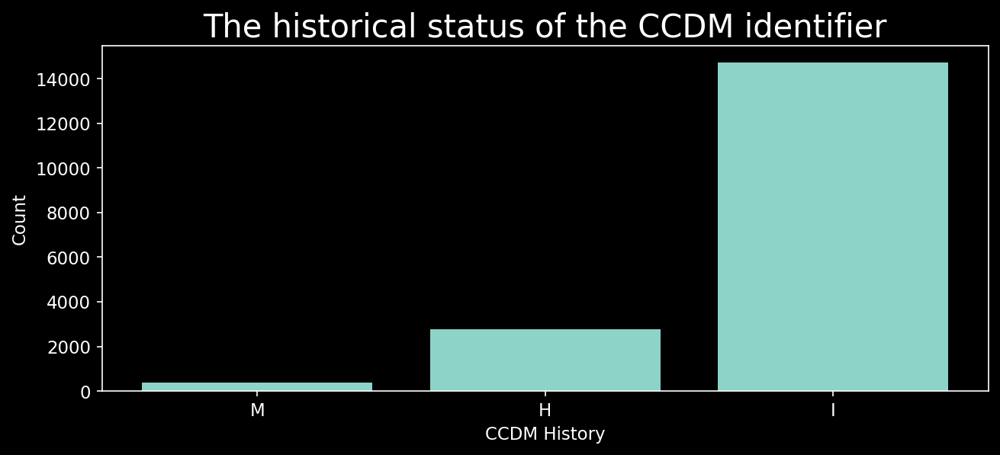

In [181]:
sources = hipp_df_color_corrected["n_CCDM"].value_counts().index
count = hipp_df_color_corrected["n_CCDM"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("CCDM History")
plt.ylabel("Count")
plt.title("The historical status of the CCDM identifier")
plt.show()

**Flag: Double and or Multiple Systems flag**

The Double and Multiple Systems Annex flag. This indicates that further details of this system are given in one of the 5 (mutually exclusive) parts of the Double and Multiple Systems Annex labelled as follows:

C : solutions for the components

G : acceleration or higher order terms

O : orbital solutions

V : variability-induced movers (apparent motion arises from variability of one of the components of a double system)

X : stochastic solution (probably astrometric binaries of short period)

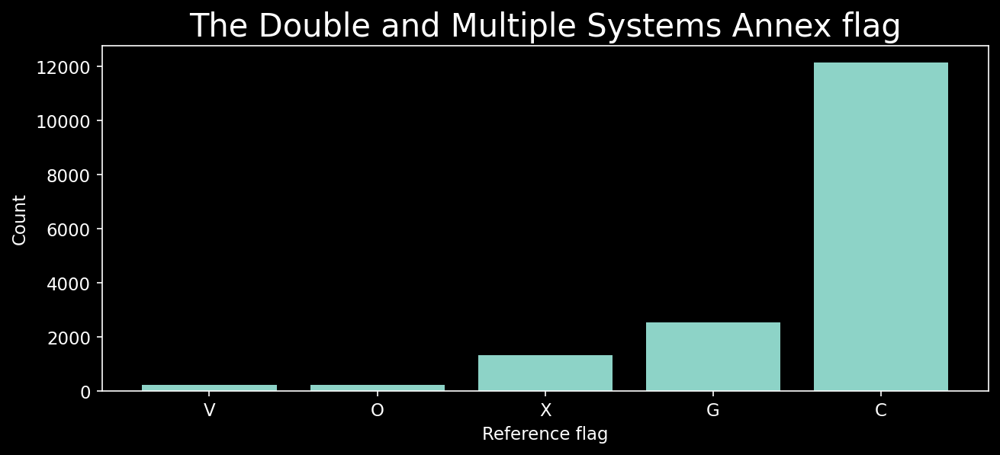

In [182]:
sources = hipp_df_color_corrected["MultFlag"].value_counts().index
count = hipp_df_color_corrected["MultFlag"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flag")
plt.ylabel("Count")
plt.title("The Double and Multiple Systems Annex flag")
plt.show()

**Flag: Astrometric source flag**

A flag for the source of the absolute astrometry. This parameter qualifies the source of the astrometric parameters for some of the entries with a value of 'C' for the parameter Dbl_Mult_Annex. The values are as follows:

P : primary target of a 2- or 3-pointing system

F : secondary or tertiary of a 2- or 3-pointing 'fixed' system (common parallax and proper motions)

I : secondary or tertiary of a 2- or 3-pointing 'independent' system (no constraints on parallax or proper motions)

L : secondary or tertiary of a 2- or 3-pointing 'linear' system (common parallax)

S : astrometric parameters from 'single-star merging' process.

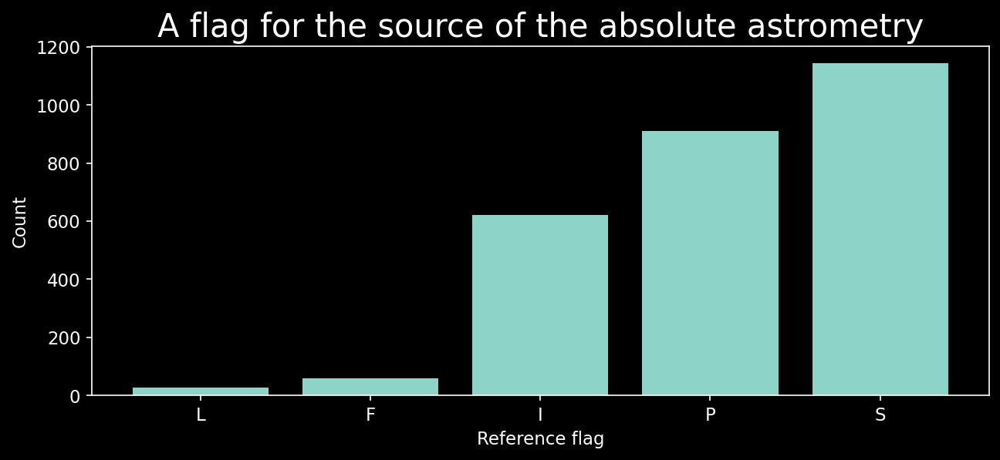

In [183]:
sources = hipp_df_color_corrected["Source"].value_counts().index
count = hipp_df_color_corrected["Source"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flag")
plt.ylabel("Count")
plt.title("A flag for the source of the absolute astrometry")
plt.show()

**Flag: Solution quality flag**

A solution quality flag which indicates the reliability of the double or multiple star solution, and is set for all entries in Part C of the Double and Multiple Systems Annex. The flags can be understood as follows:

A: 'good', or reliable solution

B: 'fair', or moderately reliable solution

C: 'poor', or less reliable solution

D: uncertain solution

S: suspected non-single, i.e., possible double or multiple, although no significant or convincing non-single star solution was found

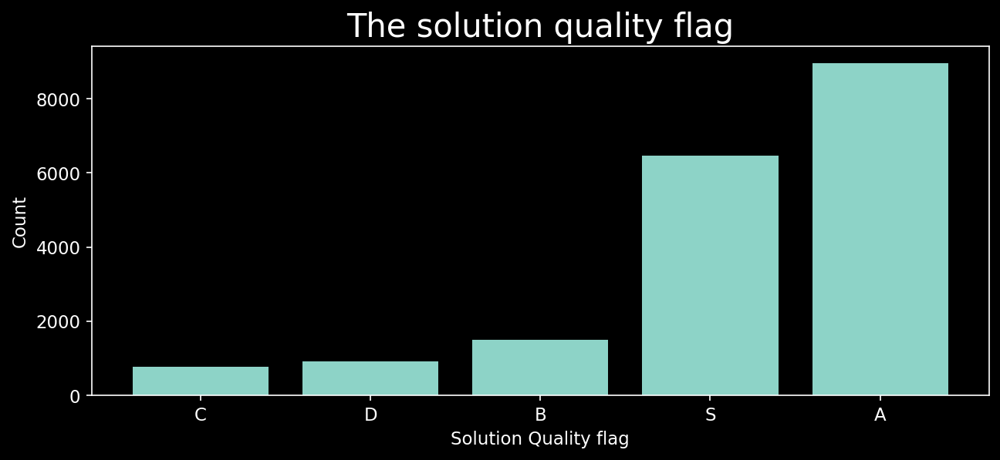

In [184]:
sources = hipp_df_color_corrected["Qual"].value_counts().index
count = hipp_df_color_corrected["Qual"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Solution Quality flag")
plt.ylabel("Count")
plt.title("The solution quality flag")
plt.show()

**Flag: Existence of notes**

A flag indicating a note is given at the end of the volume(s) in the printed catalog.
The flag has the following meaning:

D : double and multiple systems note only (Volume 10)

G : general note only (Volumes 5-9)

P : photometric (including variability) notes only (Volume 11)

W : D + P only

X : D + G only

Y : G + P only

Z : D + G + P

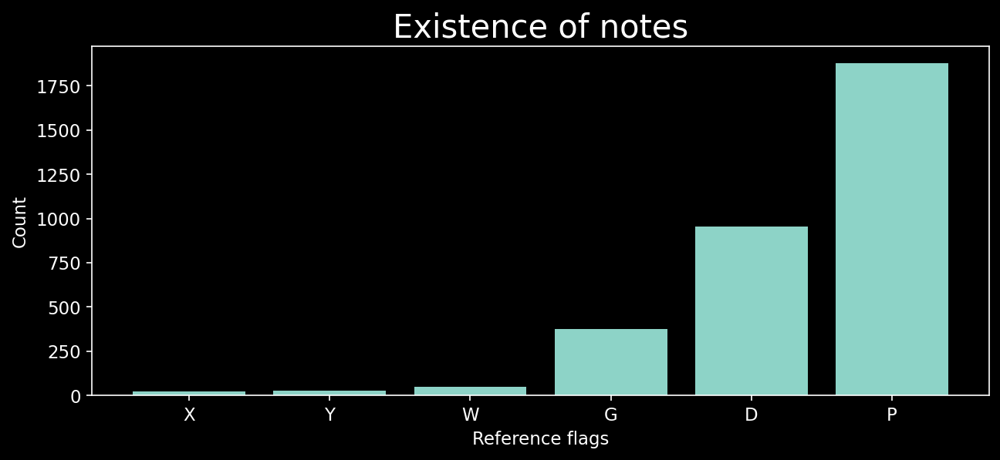

In [185]:
sources = hipp_df_color_corrected["Notes"].value_counts().index
count = hipp_df_color_corrected["Notes"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flags")
plt.ylabel("Count")
plt.title("Existence of notes")
plt.show()

**Flag: Source of spectral type**

The source of the spectral type.
The flag indicates the source as follows:

1 : Michigan catalogue for the HD stars, vol. 1 (Houk+, 1975)

2 : Michigan catalogue for the HD stars, vol. 2 (Houk, 1978)

3 : Michigan Catalogue for the HD stars, vol. 3 (Houk, 1982)

4 : Michigan Catalogue for the HD stars, vol. 4 (Houk+, 1988)

G : updated after publication of the HIC

K : General Catalog of Variable Stars, 4th Ed. (Kholopov+ 1988)

S : SIMBAD database

X : Miscellaneous

: A blank entry has no corresponding information.

Sourced from heasarc

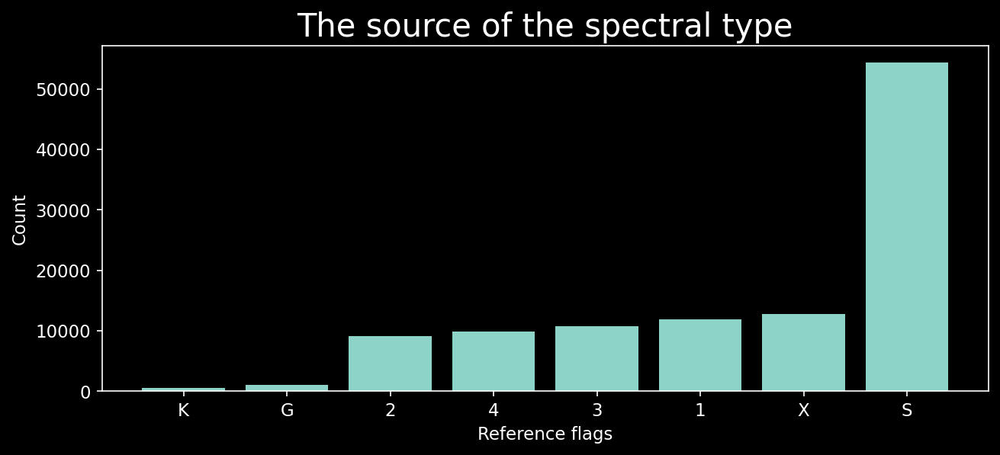

In [186]:
sources = hipp_df_color_corrected["r_SpType"].value_counts().index
count = hipp_df_color_corrected["r_SpType"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flags")
plt.ylabel("Count")
plt.title("The source of the spectral type")
plt.show()

**Flag: Reference flag for BT and VTmag**

A reference flag for BT_mag and VT_mag which indicates, for non-single stars, the component measured in Tycho photometry, or indicates that several components have been directly measured together by Tycho, or have had their Tycho data combined. The flag takes the following values:

A, B, etc. : the Tycho photometry refers to the designated Hipparcos Catalog component

\* : the Tycho photometry refers to all components of the relevant Hipparcos entry

\- : the Tycho photometry refers to a single-pointing triple or quadruple system, for which only a close pair has been observed by Tycho, the other components being too faint to be detected by Tycho

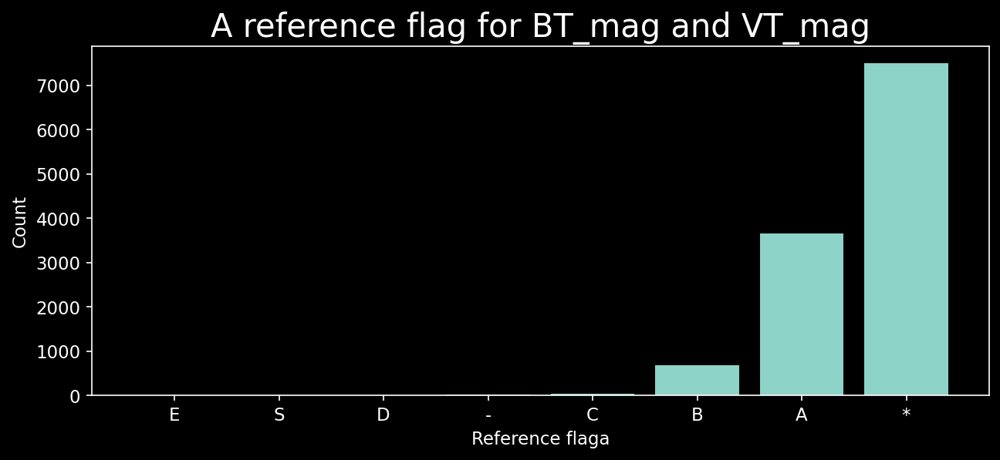

In [187]:
sources = hipp_df_color_corrected["m_BTmag"].value_counts().index
count = hipp_df_color_corrected["m_BTmag"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flaga")
plt.ylabel("Count")
plt.title("A reference flag for BT_mag and VT_mag")
plt.show()

**Flag: Source of BV from Ground or Tycho**

The source of the (B-V) color index, BV_Color:

G: indicates that it was taken from ground-based observations

T: indicates that it was determined from the transformed Tycho (B_T-V_T) data

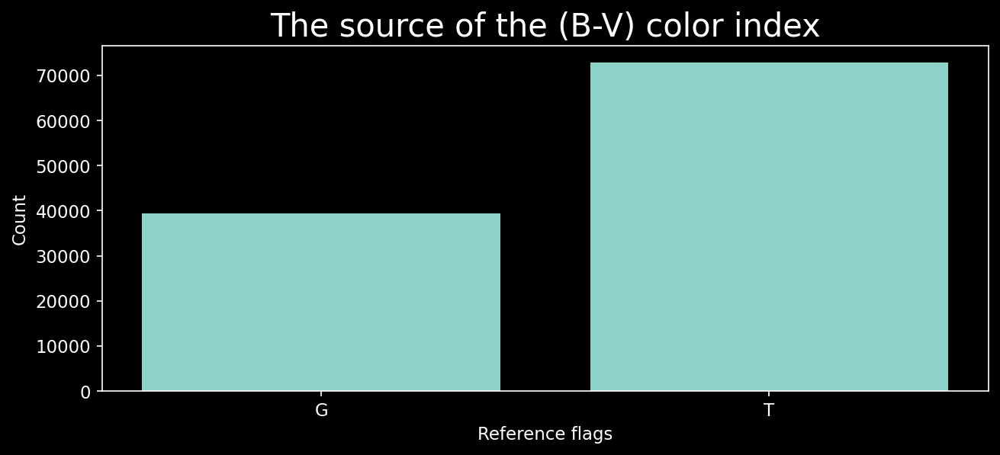

In [188]:
sources = hipp_df_color_corrected["r_B-V"].value_counts().index
count = hipp_df_color_corrected["r_B-V"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flags")
plt.ylabel("Count")
plt.title("The source of the (B-V) color index")
plt.show()

**Flag: Source of VI**

The Source of the (V-I) color index, VI_Color (see Section 1.3, Appendix 5 of the published Hipparcos Catalog for full details):

'A' :for an observation of V-I in Cousins' system

'B' to 'K' :when V-I derived from measurements in other bands/photoelectric systems

'L' to 'P' :when V-I derived from Hipparcos and Star Mapper photometry

'Q' :for long-period variables

'R' to 'T' :when colors are unknown

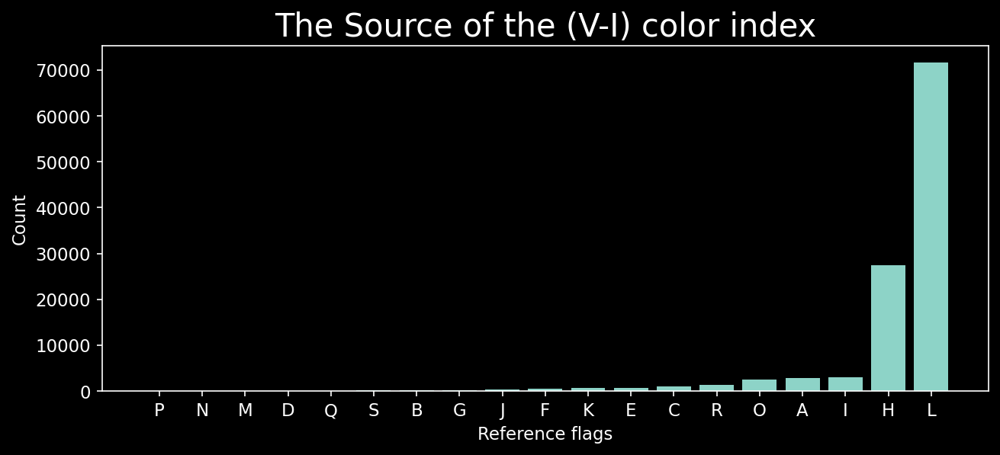

In [189]:
sources = hipp_df_color_corrected["r_V-I"].value_counts().index
count = hipp_df_color_corrected["r_V-I"].value_counts().values
data_df = pd.DataFrame({"sources": sources,
                       "sources_count": count})
data_df = data_df.sort_values("sources_count")
plt.bar(data_df["sources"], data_df["sources_count"])
plt.xlabel("Reference flags")
plt.ylabel("Count")
plt.title("The Source of the (V-I) color index")
plt.show()

### Conclusion

In this notebook, we learned a few basic things about Astronomy. We covered the below topics in order,

1. Astronomical coordinate system
2. Proper motions of stars
3. Distances in Astronomy
4. Spectral Types
5. Spectral Types along with Luminosity classes
6. The magnitude system in Astronomy
7. Variable stars
8. The HR diagram
9. Measurement errors in Astronomy
10. Survey meta data

Before, we end, I must remind you once again that the analysis shown in this notebook does not take into consideration the corrections using flags and other recommended corrections published by the Hipparchos survey itself and thus are highly inaccurate. Tackling those in the introductory notebook on astronomy will be an overkill and thus I have kept the analysis fairly straightforward and simple.

Aside:
If you feel that the custom functions used in the notebook could be written with fewer lines of codes or even better if you have any recommendation on the overall quality of the notebook, I would like to hear from you.